# Insurance Claims- Fraud Detection

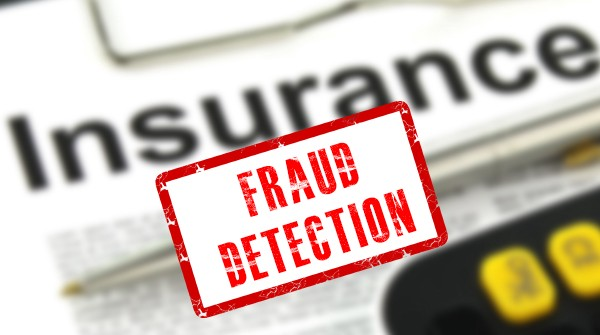

# Problem Statement:

# Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Automobile_insurance_fraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
type(df)

pandas.core.frame.DataFrame

In [4]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [5]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [6]:
df.sample(3)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
382,113,29,999435,01-01-2008,OH,250/500,2000,1091.73,0,601213,...,YES,49950,5550,5550,38850,Nissan,Ultima,2004,Y,NaN
708,46,41,315041,02-11-2010,OH,100/300,2000,998.19,0,611556,...,?,78600,13100,19650,45850,Dodge,RAM,2004,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN


In [7]:
df.shape

(1000, 40)

<b>The dataset consists of 1000 rows and 40 columns.</b>

In [8]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

<b>The dataset consists of 40 columns. Here, the column 'fraud_reported' is the target variable and the remaining columns are the features.</b>

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [10]:
# Let's check the number of unique values present in the dataset

df.nunique().to_frame("No of Unique Values")

,No of Unique Values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


In [11]:
# As there are no unique values present in the column '_c39', let's just drop it

df.drop('_c39', axis=1, inplace=True)

In [12]:
# Also, let's drop the columns 'policy_number' and 'incident_location', as these columns contain only unique values

df.drop('policy_number', axis=1, inplace=True)
df.drop('incident_location', axis=1, inplace=True)

In [13]:
# Let's also drop the column 'insured_zip' as it contains 995 unique values

df.drop('insured_zip', axis=1, inplace=True)

In [14]:
df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,17-10-2014,OH,250/500,1000,1406.91,0,MALE,MD,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,MALE,MD,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,06-09-2000,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,25-05-1990,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,6000000,MALE,Associate,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,16-07-1991,OH,500/1000,1000,1310.80,0,FEMALE,Masters,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,05-01-2014,IL,100/300,1000,1436.79,0,FEMALE,PhD,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,17-02-2003,OH,250/500,500,1383.49,3000000,FEMALE,Masters,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,18-11-2011,IL,500/1000,2000,1356.92,5000000,MALE,Associate,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


<b>Now, we are left with 1000 rows and 36 columns.</b>

In [15]:
# Let's check the null values

df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_c

<b>As we can see, there are no null values in the dataset.</b>

<AxesSubplot:>

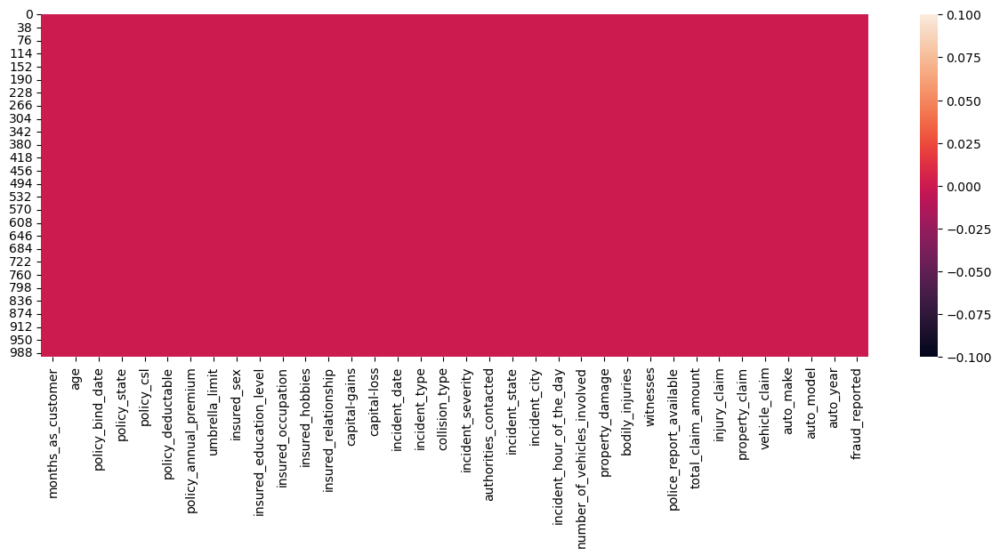

In [16]:
plt.figure(figsize=(15,5))

sns.heatmap(df.isnull())

<b>We can confirm that there are no null values in the dataset by looking at the Heat Map.</b>

In [17]:
# Let's check the value counts of each column

for i in df.columns:
    print('\n','__________________________________')
    print(df[i].value_counts())


 __________________________________
194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64

 __________________________________
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64

 __________________________________
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64

 __________________________________
OH    352
IL    338
IN    310
Name: p

<b>By looking at the value counts of each column, we can observe that the columns 'umbrella_limit', 'capital-gains' and 'capital-loss' contain a large number of zero values, i.e., around 79.8%, 50.8% and 47.5%. Let's keep the zero values in capital_gains and capital_loss columns as it is. Since the column 'umbrella_limit' has more that 70% of zero values, let's drop that column.</b>

In [18]:
# Let's drop the column 'umbrella_limit'

df.drop('umbrella_limit', axis=1, inplace=True)

In [19]:
df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,17-10-2014,OH,250/500,1000,1406.91,MALE,MD,craft-repair,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,27-06-2006,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,06-09-2000,OH,100/300,2000,1413.14,FEMALE,PhD,sales,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,25-05-1990,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,MALE,Associate,sales,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,16-07-1991,OH,500/1000,1000,1310.80,FEMALE,Masters,craft-repair,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,05-01-2014,IL,100/300,1000,1436.79,FEMALE,PhD,prof-specialty,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,17-02-2003,OH,250/500,500,1383.49,FEMALE,Masters,armed-forces,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,18-11-2011,IL,500/1000,2000,1356.92,MALE,Associate,handlers-cleaners,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


<b>Now, we are left with 1000 rows and 35 columns.</b>

<b>By looking at the value counts of the columns, we can observe that some columns have "?" sign.</b>

In [20]:
# Let's check which columns contain "?" sign

df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

<b>Thus, the columns 'collision_type', property_damage' and 'police_report_available' contains "?" sign. Since these columns appear to be categorical in nature, so let's replace "?" values with most frequently occurring values of the respective columns that is their mode values.</b>

In [21]:
# Let's check the mode of the columns 'collision_type', property_damage' and 'police_report_available'

print("The mode of collision_type is:",df["collision_type"].mode())
print("The mode of property_damage is:",df["property_damage"].mode())
print("The mode of police_report_available is:",df["police_report_available"].mode())

The mode of collision_type is: 0    Rear Collision
Name: collision_type, dtype: object
The mode of property_damage is: 0    ?
Name: property_damage, dtype: object
The mode of police_report_available is: 0     ?
1    NO
Name: police_report_available, dtype: object


<b>The mode of the columns 'property_damage' and 'police_report_available' is "?", which means the data is almost covered by "?" sign. So, we will fill them by the second highest count of the respective column.</b>

In [22]:
# Let's check the value count of the columns 'property_damage' and 'police_report_available'

print("The value count of property_damage:\n", df["property_damage"].value_counts())
print("\n")
print("The value count of police_report_available:\n", df["police_report_available"].value_counts())

The value count of property_damage:
 ?      360
NO     338
YES    302
Name: property_damage, dtype: int64


The value count of police_report_available:
 ?      343
NO     343
YES    314
Name: police_report_available, dtype: int64


<b>As we can see, "NO" is the second highest occurring category in both the columns 'property_damage' and 'police_report_available'. So, let's replace "?" by "NO".</b>

In [23]:
# Let's replace "?" by their mode values

df['collision_type'] = df.collision_type.str.replace('?', df['collision_type'].mode()[0])
df['property_damage'] = df.property_damage.str.replace('?', "NO")
df['police_report_available'] = df.police_report_available.str.replace('?', "NO")

In [24]:
# Let's check the value counts of the columns 'collision_type', property_damage' and 'police_report_available' again

print("The value count of collision_type:\n", df["collision_type"].value_counts())
print("\n")
print("The value count of property_damage:\n", df["property_damage"].value_counts())
print("\n")
print("The value count of police_report_available:\n", df["police_report_available"].value_counts())

The value count of collision_type:
 Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


The value count of property_damage:
 NO     698
YES    302
Name: property_damage, dtype: int64


The value count of police_report_available:
 NO     686
YES    314
Name: police_report_available, dtype: int64


In [25]:
df.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                

In [26]:
# As the columns 'policy_bind_date' and 'incident_date' are of object datatype, let us convert it into datetime type

df['policy_bind_date'] = pd.to_datetime(df['policy_bind_date'])
df['incident_date'] = pd.to_datetime(df['incident_date'])

In [27]:
df.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                          object
incident_hour_of_the_day          

In [28]:
#Extracting Day from the column 'policy_bind_date'
df['policy_bind_Day'] = pd.to_datetime(df.policy_bind_date,format="%d/%m/%Y").dt.day


#Extracting Month from the column 'policy_bind_date'
df['policy_bind_Month'] = pd.to_datetime(df.policy_bind_date, format="%d/%m/%Y").dt.month


#Extracting Year from the column 'policy_bind_date'
df['policy_bind_Year'] = pd.to_datetime(df.policy_bind_date, format="%d/%m/%Y").dt.year

In [29]:
#Extracting Day from the column 'incident_date'
df['incident_Day'] = pd.to_datetime(df.incident_date,format="%d/%m/%Y").dt.day


#Extracting Month from the column 'incident_date'
df['incident_Month'] = pd.to_datetime(df.incident_date, format="%d/%m/%Y").dt.month


#Extracting Year from the column 'incident_date'
df['incident_Year'] = pd.to_datetime(df.incident_date, format="%d/%m/%Y").dt.year

In [30]:
# Now, let's drop the columns 'policy_bind_date' and 'incident_date'

df.drop(columns = ['policy_bind_date'],inplace = True)
df.drop(columns = ['incident_date'],inplace = True)
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,incident_Year
0,328,48,OH,250/500,1000,1406.91,MALE,MD,craft-repair,sleeping,...,Saab,92x,2004,Y,17,10,2014,25,1,2015
1,228,42,IN,250/500,2000,1197.22,MALE,MD,machine-op-inspct,reading,...,Mercedes,E400,2007,Y,27,6,2006,21,1,2015
2,134,29,OH,100/300,2000,1413.14,FEMALE,PhD,sales,board-games,...,Dodge,RAM,2007,N,9,6,2000,22,2,2015
3,256,41,IL,250/500,2000,1415.74,FEMALE,PhD,armed-forces,board-games,...,Chevrolet,Tahoe,2014,Y,25,5,1990,1,10,2015
4,228,44,IL,500/1000,1000,1583.91,MALE,Associate,sales,board-games,...,Accura,RSX,2009,N,6,6,2014,17,2,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,FEMALE,Masters,craft-repair,paintball,...,Honda,Accord,2006,N,16,7,1991,22,2,2015
996,285,41,IL,100/300,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,...,Volkswagen,Passat,2015,N,1,5,2014,24,1,2015
997,130,34,OH,250/500,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,...,Suburu,Impreza,1996,N,17,2,2003,23,1,2015
998,458,62,IL,500/1000,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,...,Audi,A5,1998,N,18,11,2011,26,2,2015


In [31]:
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                        int64
police_report_available         object
total_claim_amount       

<b>As we can see, the column 'policy_csl' consists of numerical data, but it is showing that it contains object data. But, we cannot convert it directly into object datatype, as "/" is present in between the two integer numbers. Hence, we need to split the column 'policy_csl' into two separate columns, and then convert it into integer datatype</b>

In [32]:
# Let's split the column 'policy_csl' into two separate columns 'csl_per_person' and 'csl_per_accident'

df['csl_per_person'] = df.policy_csl.str.split('/', expand=True)[0]
df['csl_per_accident'] = df.policy_csl.str.split('/', expand=True)[1]

In [33]:
# Now, let's convert the columns from object datatype into integer datatype

df['csl_per_person'] = df['csl_per_person'].astype('int64')
df['csl_per_accident'] = df['csl_per_accident'].astype('int64')

In [34]:
# Since we have extracted the data from the column 'policy_csl', let's drop that column

df.drop('policy_csl', axis=1, inplace=True)

In [35]:
# Let's check the number of unique values present in the dataset again

df.nunique().to_frame("No of Unique Values")

,No of Unique Values
months_as_customer,391
age,46
policy_state,3
policy_deductable,3
policy_annual_premium,991
insured_sex,2
insured_education_level,7
insured_occupation,14
insured_hobbies,20
insured_relationship,6


<b>Let's drop the column 'incident_Year' as it contains only a single unique value, and hence serves no purpose in our analysis.</b>

In [36]:
df.drop('incident_Year', axis=1, inplace=True)

In [37]:
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,...,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,...,92x,2004,Y,17,10,2014,25,1,250,500
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,...,E400,2007,Y,27,6,2006,21,1,250,500
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,...,RAM,2007,N,9,6,2000,22,2,100,300
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,...,Tahoe,2014,Y,25,5,1990,1,10,250,500
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,...,RSX,2009,N,6,6,2014,17,2,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,...,Accord,2006,N,16,7,1991,22,2,500,1000
996,285,41,IL,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,...,Passat,2015,N,1,5,2014,24,1,100,300
997,130,34,OH,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,...,Impreza,1996,N,17,2,2003,23,1,250,500
998,458,62,IL,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,...,A5,1998,N,18,11,2011,26,2,500,1000


<b>Now, we are left with 1000 rows and 39 columns.</b>

# Statistical Description of the Dataset

In [38]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,...,property_claim,vehicle_claim,auto_year,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,...,7399.570000,37928.950000,2005.103000,15.448000,6.559000,2001.604000,13.08400,3.407000,272.650000,580.200000
std,115.113174,9.140287,611.864673,244.167395,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,...,4824.726179,18886.252893,6.015861,8.850176,3.391758,7.360391,10.44318,3.276291,161.603196,287.420547
min,0.000000,19.000000,500.000000,433.330000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,...,0.000000,70.000000,1995.000000,1.000000,1.000000,1990.000000,1.00000,1.000000,100.000000,300.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,...,4445.000000,30292.500000,2000.000000,8.000000,4.000000,1995.000000,2.00000,1.000000,100.000000,300.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,...,6750.000000,42100.000000,2005.000000,16.000000,7.000000,2002.000000,15.00000,2.000000,250.000000,500.000000
75%,276.250000,44.000000,2000.000000,1415.695000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,...,10885.000000,50822.500000,2010.000000,23.000000,9.000000,2008.000000,22.00000,5.000000,500.000000,1000.000000
max,479.000000,64.000000,2000.000000,2047.590000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,...,23670.000000,79560.000000,2015.000000,31.000000,12.000000,2015.000000,31.00000,12.000000,500.000000,1000.000000


<AxesSubplot:>

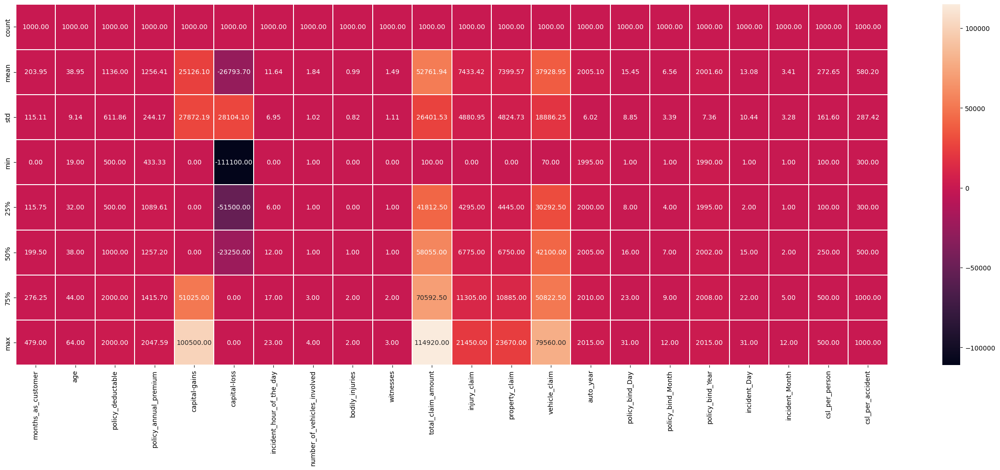

In [39]:
# Now, let's visualize the statistics of the columns using Heatmap

plt.figure(figsize=(30,10))

sns.heatmap(df.describe(), linewidths=0.1, fmt='0.2f', annot=True)

In [40]:
# Now, let's separate the categorical columns

categorical_columns = []

for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [41]:
# Now, let's separate the numerical columns

numerical_columns = []

for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'policy_bind_Day', 'policy_bind_Month', 'policy_bind_Year', 'incident_Day', 'incident_Month', 'csl_per_person', 'csl_per_accident']


# Data Visualization

# Univariate Analysis

<b>Now, let's visualize the categorical columns</b>

<AxesSubplot:ylabel='fraud_reported'>

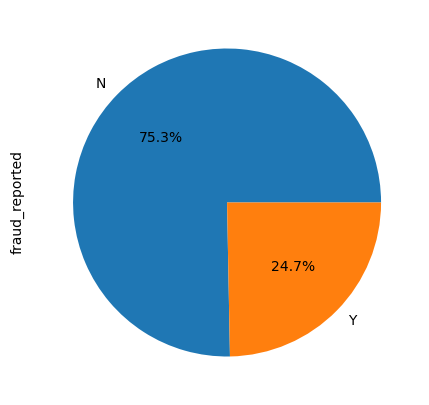

In [42]:
df['fraud_reported'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, 24.7% of the times fraud is reported.</b>

<AxesSubplot:ylabel='policy_state'>

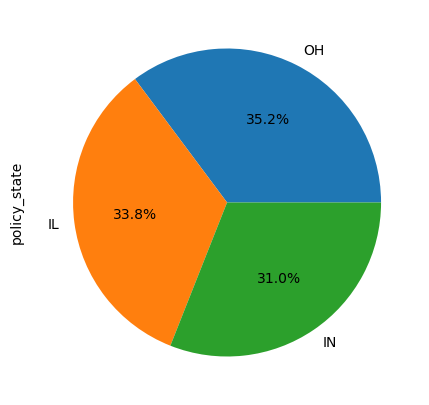

In [43]:
df['policy_state'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, 35.2% of the insured people belong to the policy state OH, followed by 33.8% who belong to the policy state IL.</b>

<AxesSubplot:ylabel='insured_sex'>

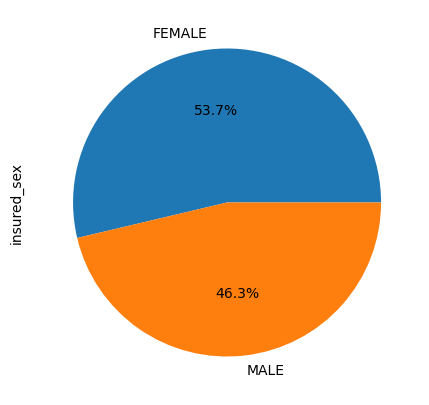

In [44]:
df['insured_sex'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, 53.7% of the insured people are female, followed by 46.3% of the insured people who are male.</b>

<AxesSubplot:ylabel='insured_education_level'>

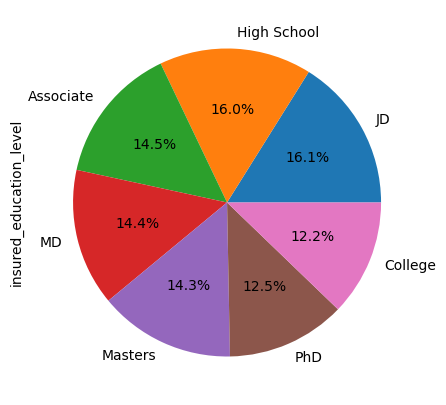

In [45]:
df['insured_education_level'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, education level of 16% of the insured people is High School, followed by 14.5% of the insured people whose education level is Associate.</b>

<AxesSubplot:ylabel='insured_occupation'>

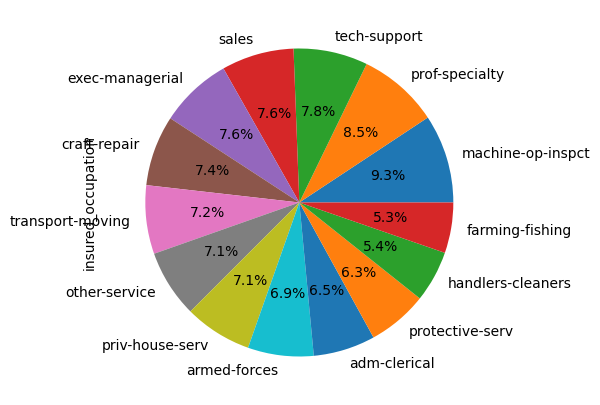

In [46]:
df['insured_occupation'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, occupation of 9.3% of the insured people is machine-op-inspct, followed by 8.5% of the insured people whose occupation is prof-specialty.</b>

<AxesSubplot:ylabel='insured_hobbies'>

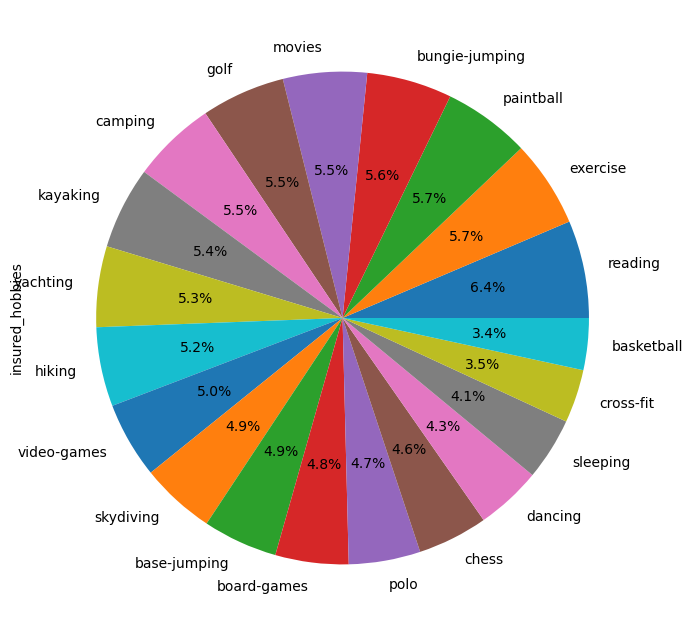

In [47]:
df['insured_hobbies'].value_counts().plot.pie(figsize = (8,8), autopct = '%.1f%%')

<b>As we can see, hobby of 6.4% of the insured people is reading, followed by 5.7% of the insured people whose hobby is exercise and paintball.</b>

<AxesSubplot:ylabel='insured_relationship'>

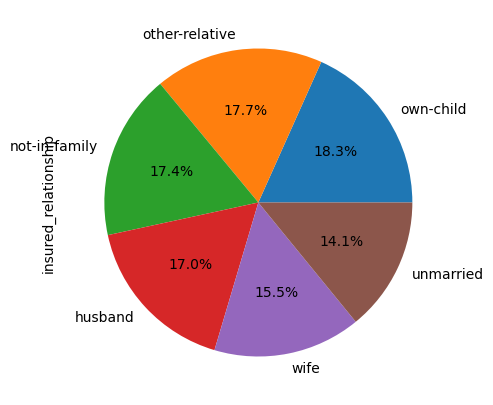

In [48]:
df['insured_relationship'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, relationship of 18.3% of the insured people is own-child, followed by 17.7% of the insured people whose relationship is other-relative.</b>

<AxesSubplot:ylabel='incident_type'>

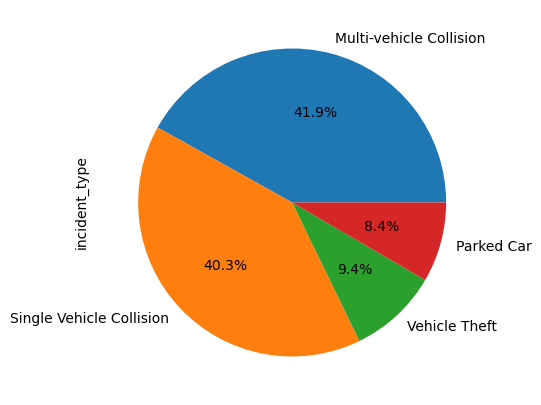

In [49]:
df['incident_type'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, 41.9% of the incidents are multi-vehicle collision,  followed by 40.3% of single vehicle collision.</b>

<AxesSubplot:ylabel='collision_type'>

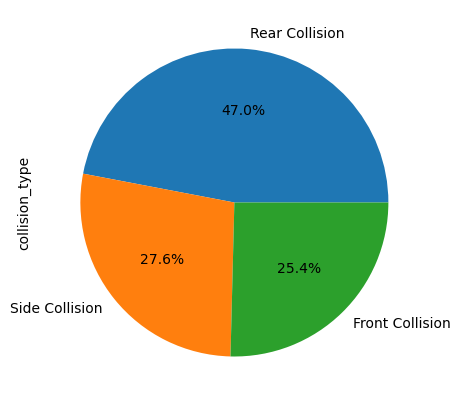

In [50]:
df['collision_type'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, 47% of the times a rear collision has occurred, followed by 27.6% of the times, when a side collision has occurred.</b>

<AxesSubplot:ylabel='incident_severity'>

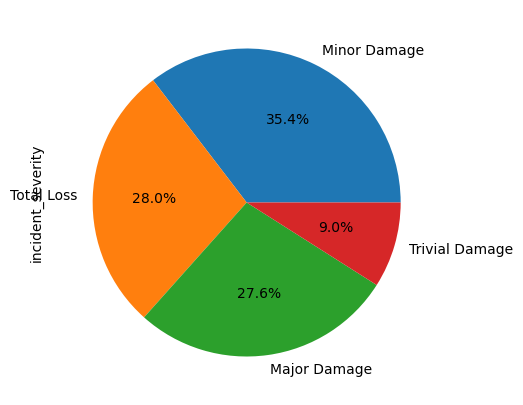

In [51]:
df['incident_severity'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, 35.4% of the times, there was a minor damage, followed by 28% of the times, when there was a total loss.</b>

<AxesSubplot:ylabel='authorities_contacted'>

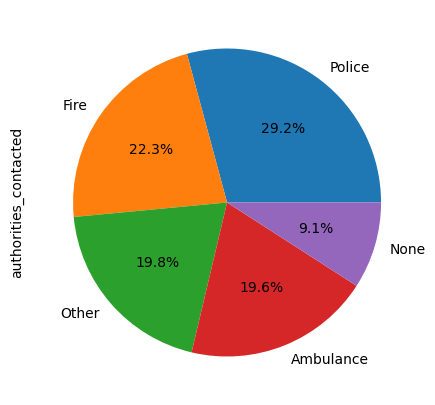

In [52]:
df['authorities_contacted'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, in 29.2% of the cases, police department was contacted, followed by 22.3% of the cases, when fire department was contacted.         
No authorities were contacted in 9.1% of the cases.</b>

<AxesSubplot:ylabel='incident_state'>

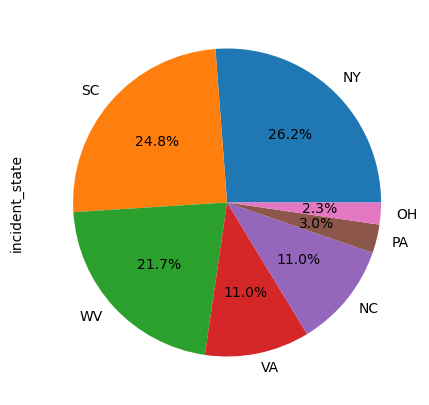

In [53]:
df['incident_state'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, 26.2% of the cases were reported from the state NY, followed by 24.8 of the cases from the state SC.        
Just 2.3% of the cases were reported from the state OH.</b>

<AxesSubplot:ylabel='incident_city'>

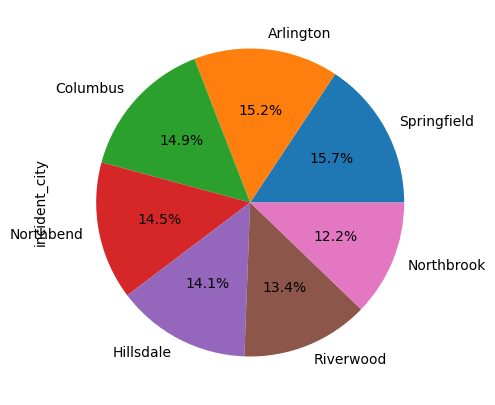

In [54]:
df['incident_city'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, 15.7% of the cases were reported from the city Springfield, followed by 15.2% of the cases from the city Arlington.</b>

<AxesSubplot:ylabel='property_damage'>

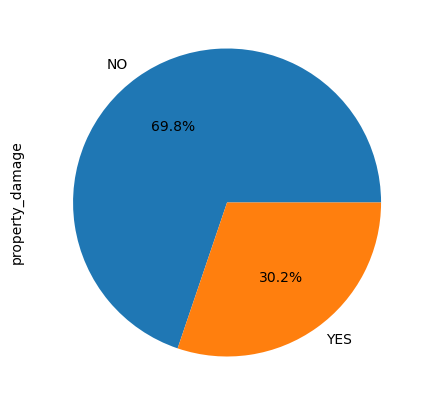

In [55]:
df['property_damage'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, in 30.2% of the cases property damage was reported, and in 69.8% of the cases, no property damage was reported.</b>

<AxesSubplot:ylabel='police_report_available'>

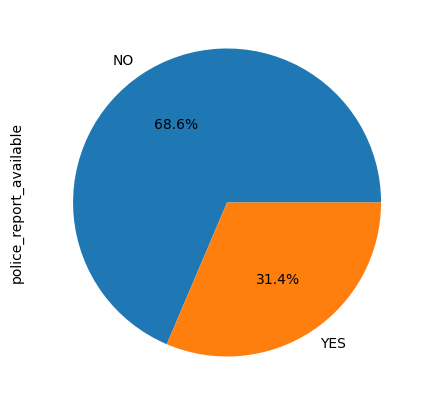

In [56]:
df['police_report_available'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, in 31.4% of the cases police report was available, and in 68.6% of the cases no ploice report was available.</b>

<AxesSubplot:ylabel='auto_make'>

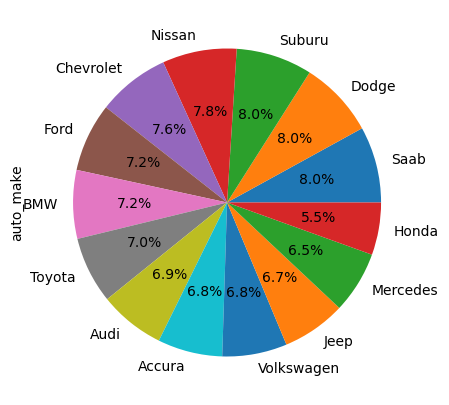

In [57]:
df['auto_make'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

<b>As we can see, in 8% of the cases, the auto make is Saab, Dodge and Suburu, followed by Nissan in 7.8% of the cases.</b>

<AxesSubplot:ylabel='auto_model'>

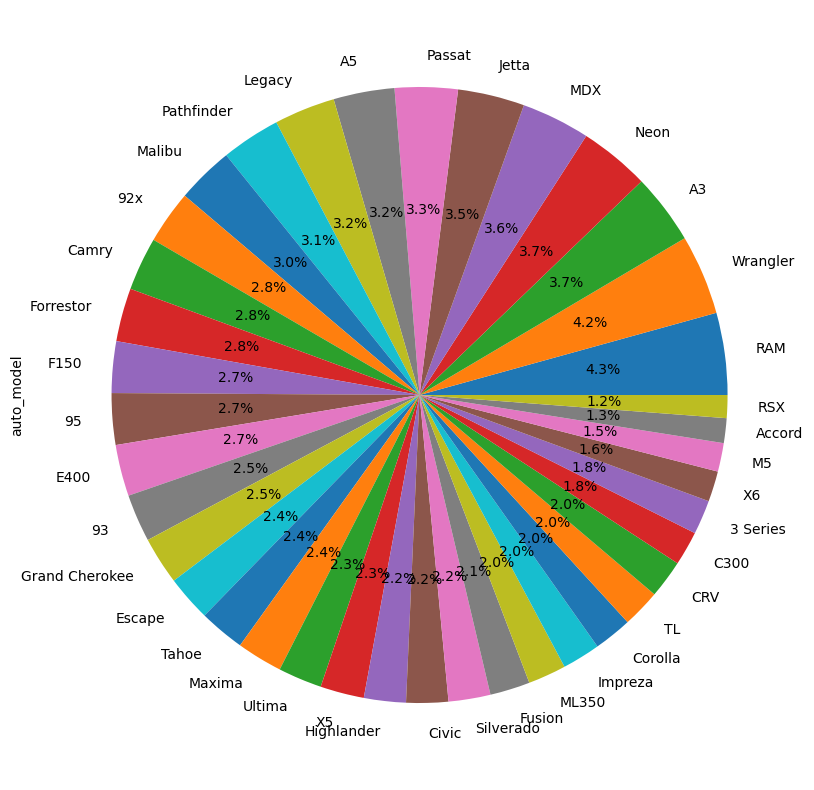

In [58]:
df['auto_model'].value_counts().plot.pie(figsize = (10,10), autopct = '%.1f%%')

<b>As we can see, the auto model is RAM in 4.3% of the cases, followed by Wrangler in 4.2% of the cases.</b>

# Checking the distribution of data for numerical columns

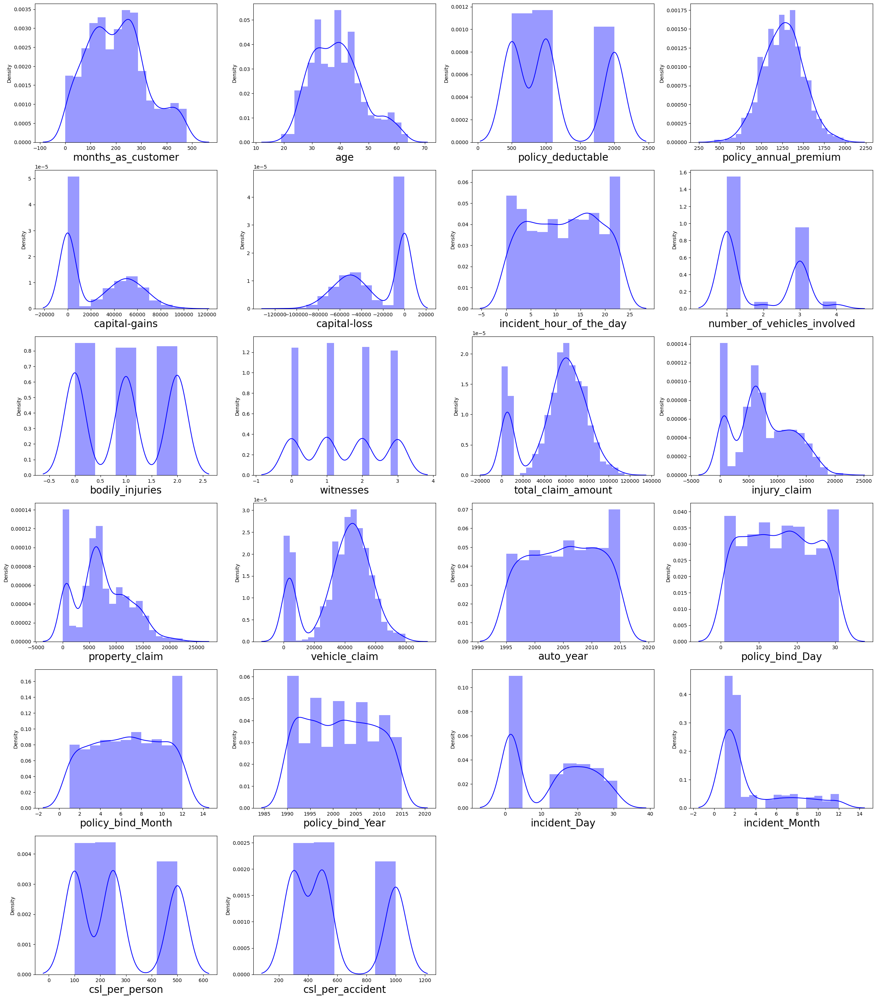

In [59]:
plt.figure(figsize=(30,35))
plotnumber = 1

for column in numerical_columns:
    if plotnumber<=24:
        ax = plt.subplot(6,4,plotnumber)
        sns.distplot(df[column], color='blue')
        plt.xlabel(column, fontsize=20)
    plotnumber+=1
plt.show()

<b>From the distribution plot above, we can observe the following things:</b>

* The columns 'capital-gains and incident_Month' are right-skewed.
* The columns 'capital-loss' is left-skewed.
* The data in the ramaining columns appears to be normally distributed.</b>

# Bivariate Analysis

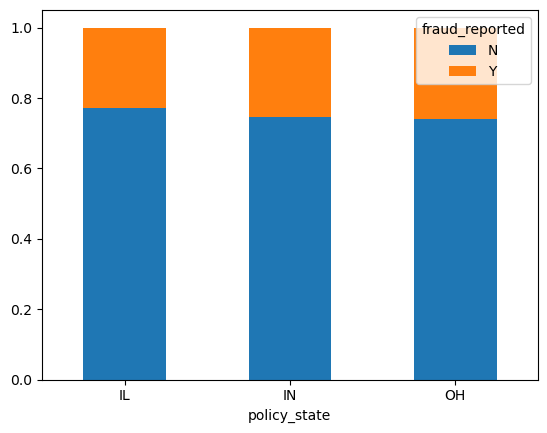

In [60]:
ct = pd.crosstab(df.policy_state, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=0)
plt.show()

<b>As we can see, fraud is likely to be reported slightly higher, when the insured people belong to the policy state OH.</b>

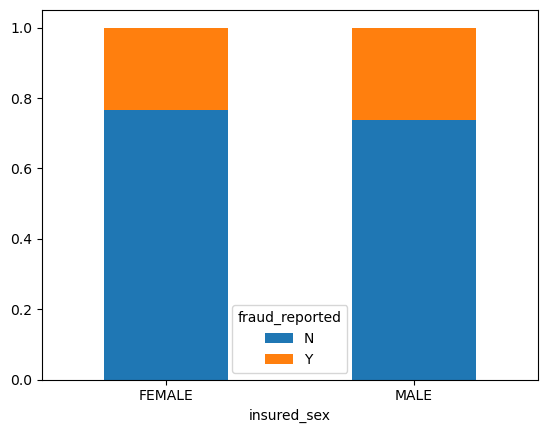

In [61]:
ct = pd.crosstab(df.insured_sex, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=0)
plt.show()

<b>As we can see, fraud is likely to be reported slightly higher in Male.</b>

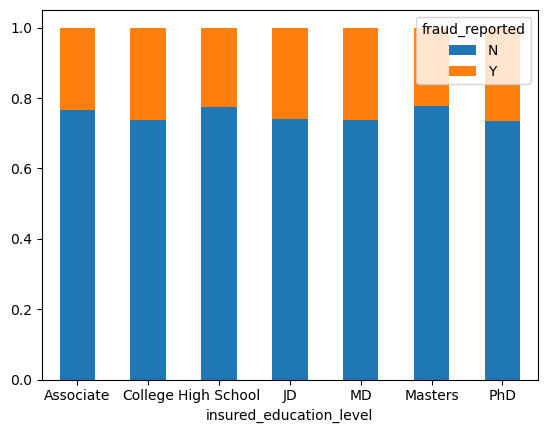

In [62]:
ct = pd.crosstab(df.insured_education_level, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=0)
plt.show()

<b>As we can see, there is no much relation between the education level of insured people and the fraud reported.</b>

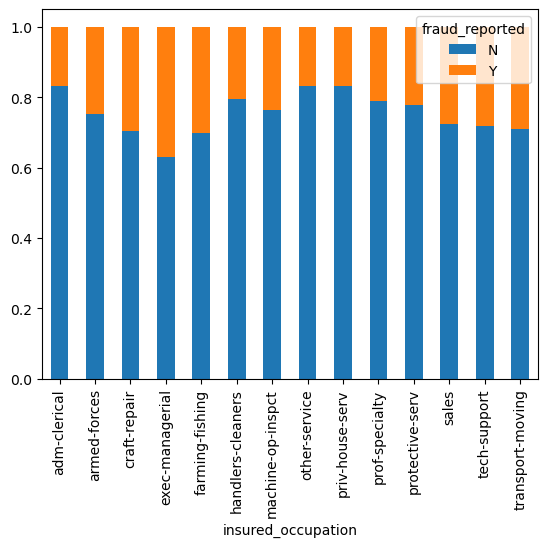

In [63]:
ct = pd.crosstab(df.insured_occupation, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=90)
plt.show()

<b>As we can see, fraud is reported highest, when the insured occupation is exec-managerial, followed by farming-fishing.</b>

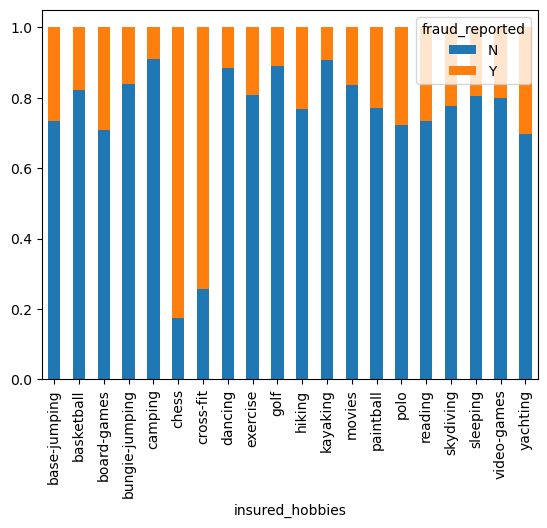

In [64]:
ct = pd.crosstab(df.insured_hobbies, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=90)
plt.show()

<b>As we can see, fraud is reported highest, when the insured hobby is chess, followed by cross-fit.</b>

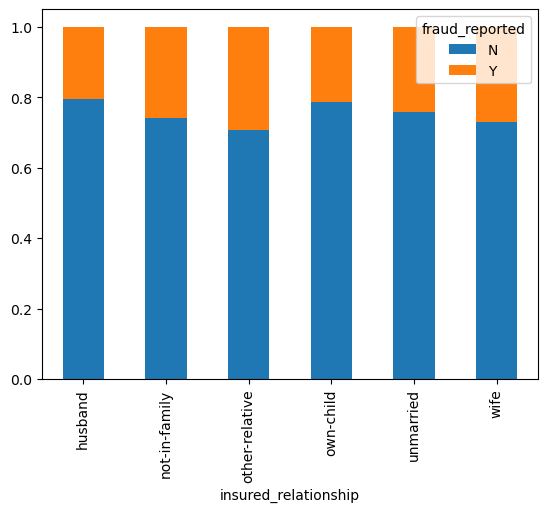

In [65]:
ct = pd.crosstab(df.insured_relationship, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=90)
plt.show()

<b>As we can see, fraud is reported highest, when the insured relationship is other-relative, followed by wife.</b>

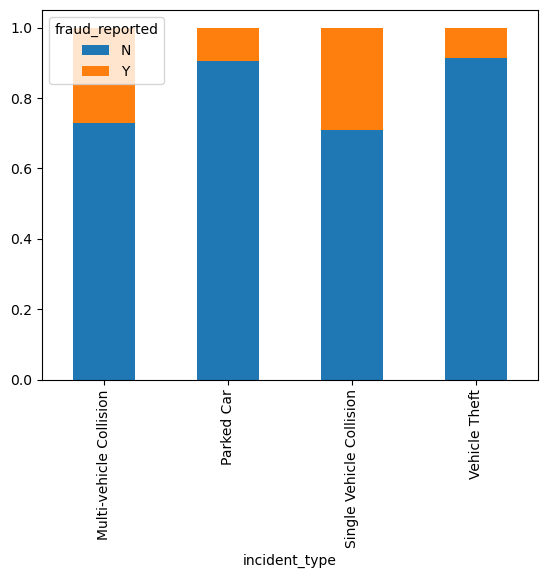

In [66]:
ct = pd.crosstab(df.incident_type, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=90)
plt.show()

<b>As we can see, fraud is reported highest when there is single vehicle collision, followed by multi-vehicle collision.</b>

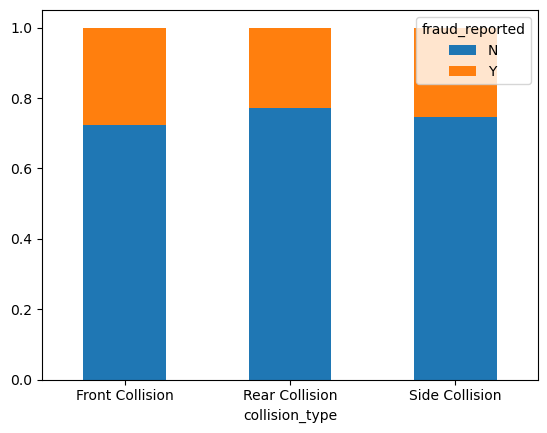

In [67]:
ct = pd.crosstab(df.collision_type, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=0)
plt.show()

<b>As we can see, fraud is reported highest when there is front collision, followed by side collision.</b>

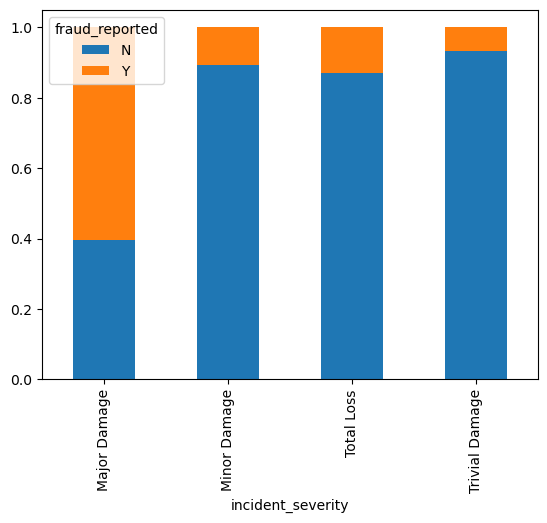

In [68]:
ct = pd.crosstab(df.incident_severity, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=90)
plt.show()

<b>As we can see, fraud is reported highest when there is major damage, followed by total loss.</b>

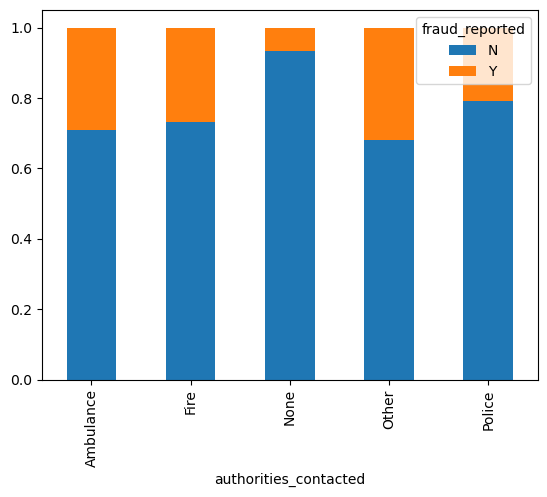

In [69]:
ct = pd.crosstab(df.authorities_contacted, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=90)
plt.show()

<b>As we can see, fraud is reported the highest, when other authorities are contacted, followed by ambulance department.          
Fraud is reported the lowest, when no authorities are contacted.</b>

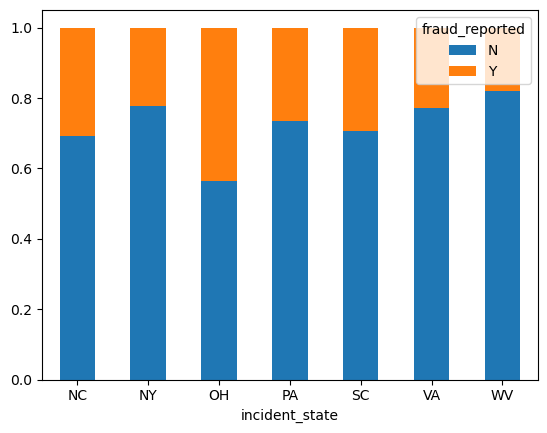

In [70]:
ct = pd.crosstab(df.incident_state, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=0)
plt.show()

<b>As we can see, fraud is reported the highest, when the incident state is OH.      
Fraud is reported the lowest, when the incident state is WV.</b>     

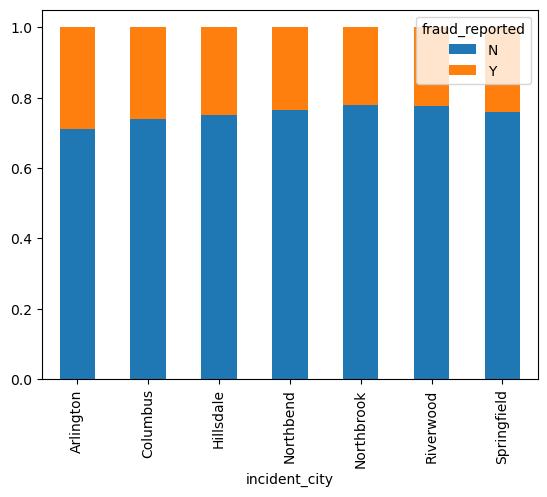

In [71]:
ct = pd.crosstab(df.incident_city, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=90)
plt.show()

<b>As we can see, fraud is reported the highest, when the incident city is Arlington.</b>

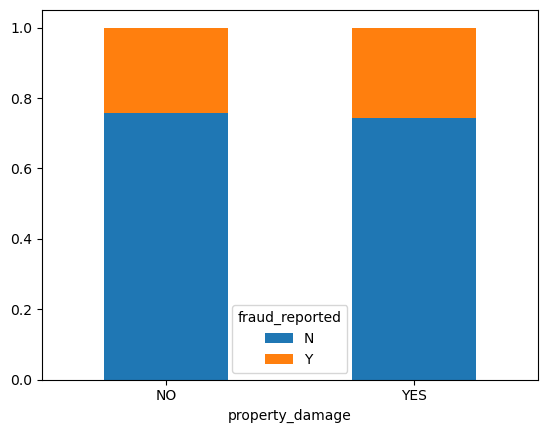

In [72]:
ct = pd.crosstab(df.property_damage, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=0)
plt.show()

<b>As we can see, property damage has no significant impact on the fraud reported.</b>

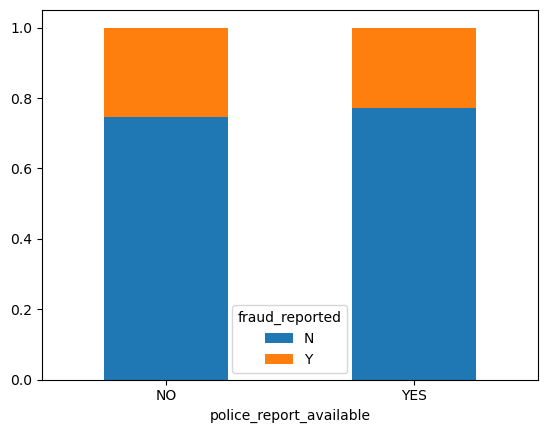

In [73]:
ct = pd.crosstab(df.police_report_available, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=0)
plt.show()

<b>As we can see, fraud is reported slightly higher, when there is no poilce report available.</b>

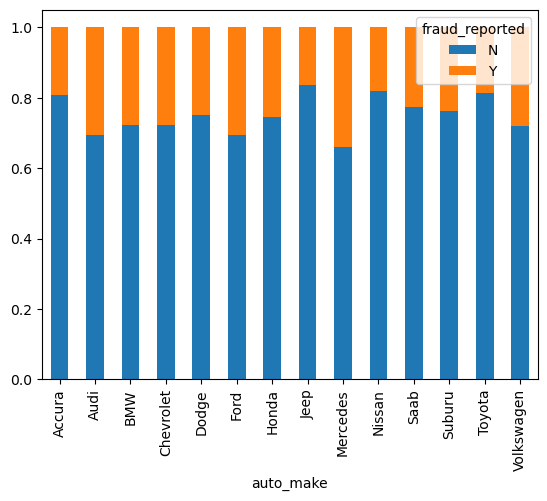

In [74]:
ct = pd.crosstab(df.auto_make, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=90)
plt.show()

<b>As we can see, fraud is reported the highest, when the auto make is Mercedes.             
Fraud is reported the lowest, when the auto make is Jeep.</b>

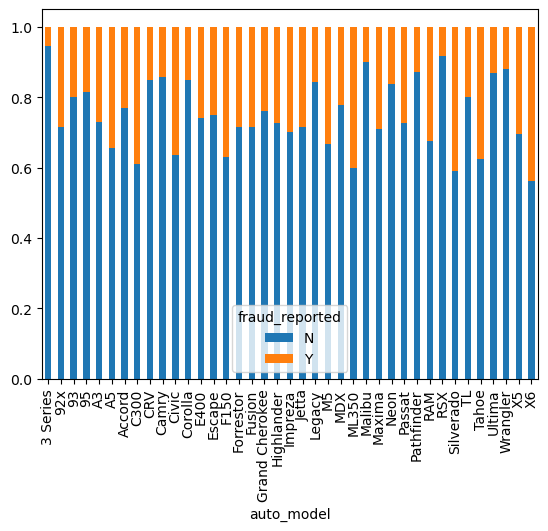

In [75]:
ct = pd.crosstab(df.auto_model, df.fraud_reported,normalize='index')
ct.plot.bar(stacked=True)
plt.xticks(rotation=90)
plt.show()

<b>As we can see, fraud is reported the highest, when the auto model is X6, followed by Silverado.          
Fraud is reported the lowest, when the auto model is 3 Series.</b>

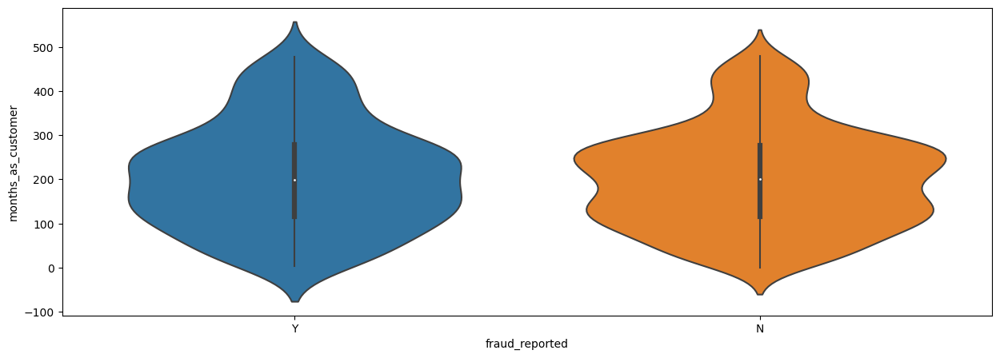

In [76]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='months_as_customer', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the person has been a customer for 140-240 months.</b>

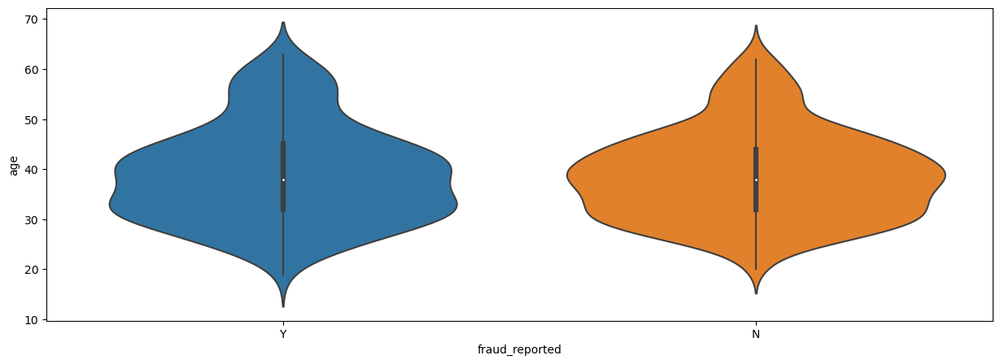

In [77]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='age', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the age of the person is between 32-42 years.</b>

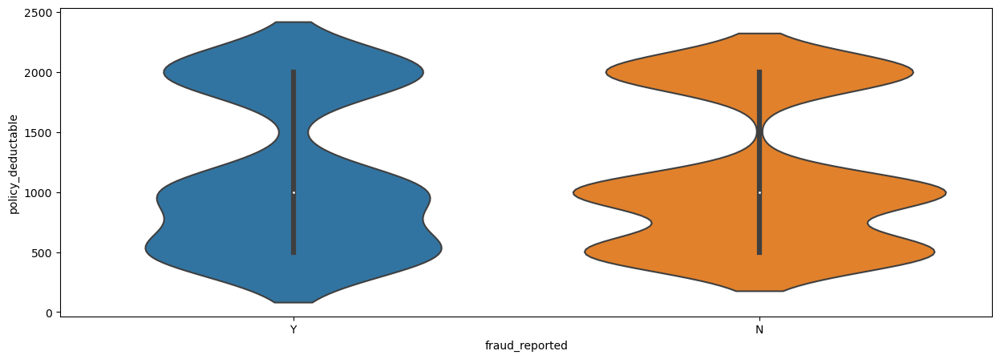

In [78]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='policy_deductable', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the policy deductable is 2000.</b>

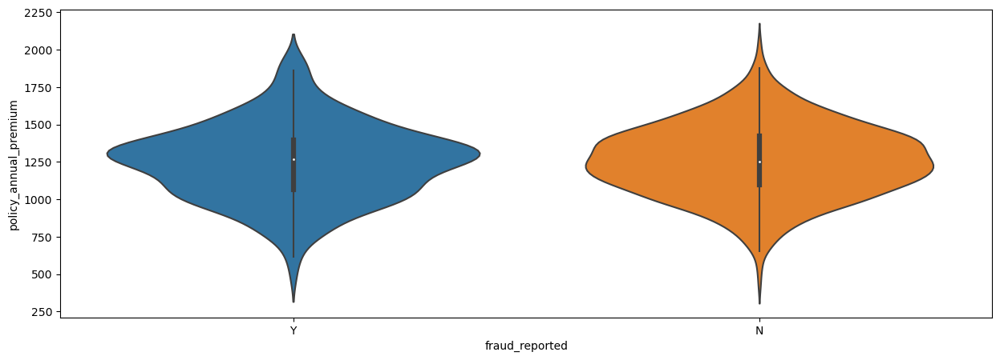

In [79]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='policy_annual_premium', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the policy annual premium is around 1300.</b>

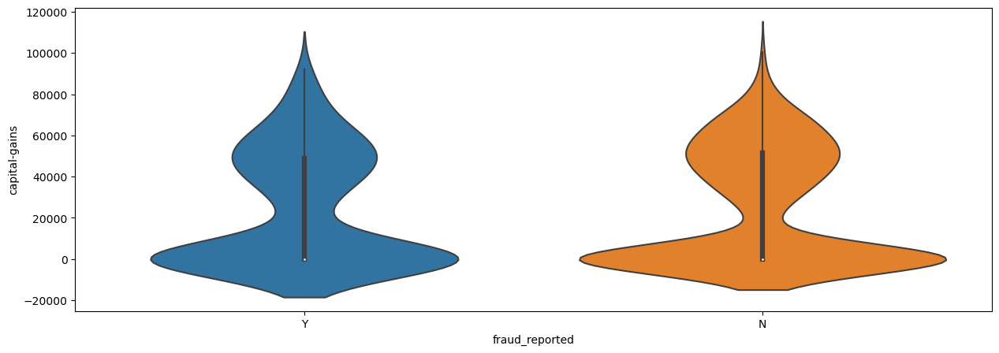

In [80]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='capital-gains', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the capital gains is 0.</b>

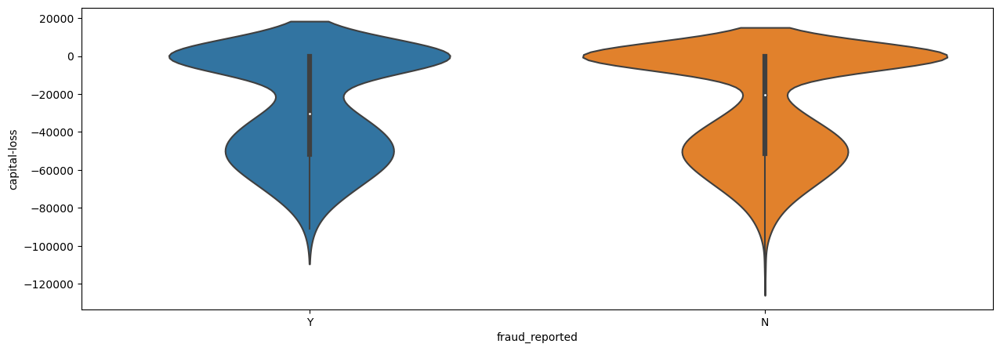

In [81]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='capital-loss', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the capital gains is 0.</b>

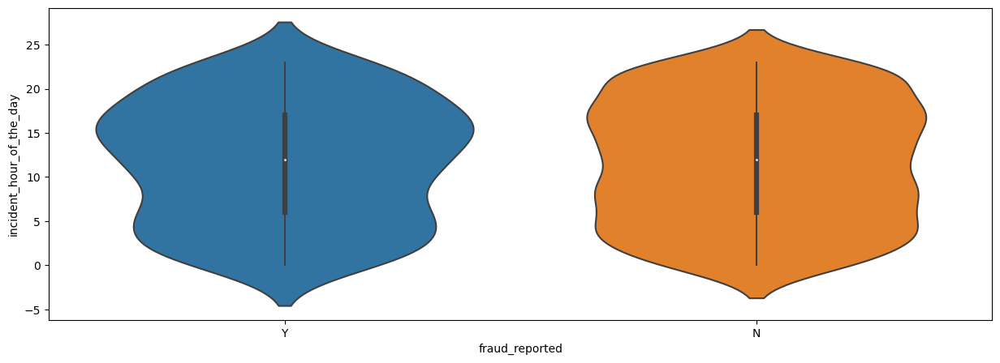

In [82]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='incident_hour_of_the_day', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the incident hour of the day is 14-17.</b>

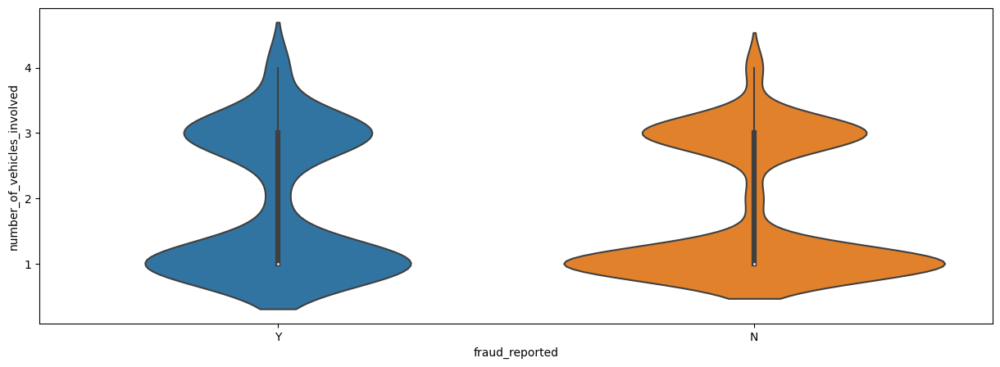

In [83]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='number_of_vehicles_involved', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the number of vehicles involved is 1.</b>

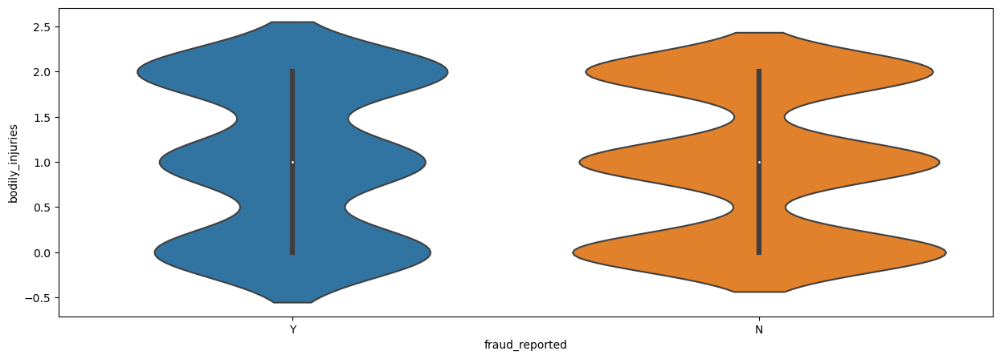

In [84]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='bodily_injuries', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the number of bodily injuries is 2.</b>

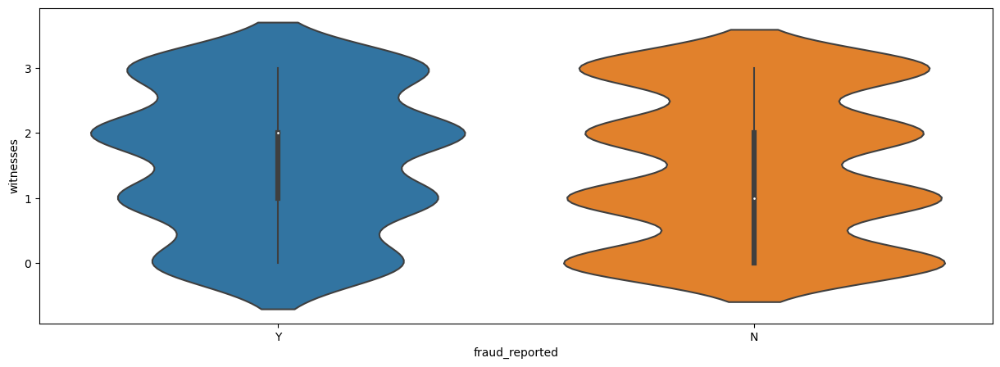

In [85]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='witnesses', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the number of witnesses is 2.</b>.

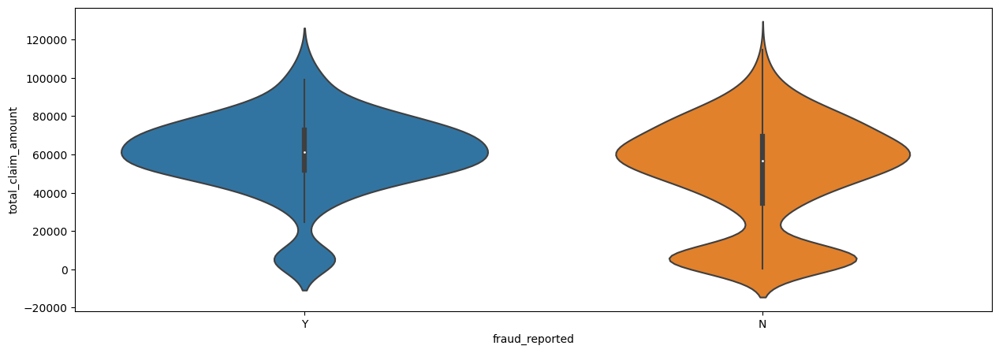

In [86]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='total_claim_amount', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the total claim amount is between 55000-65000</b>.

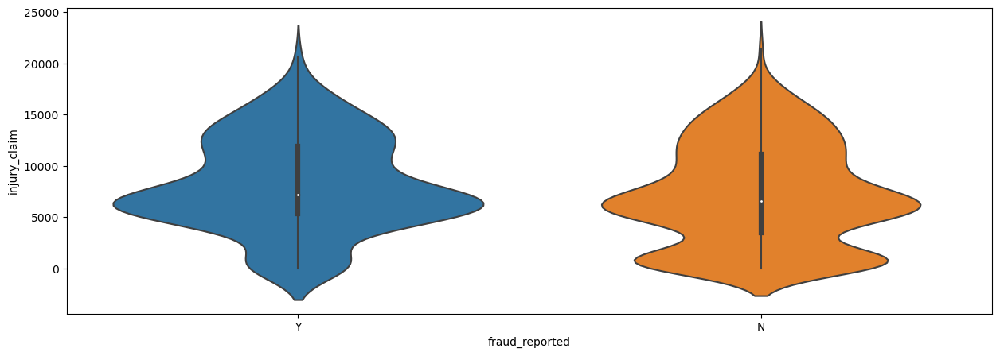

In [87]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='injury_claim', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the injury claim is between 6000-8000.</b>

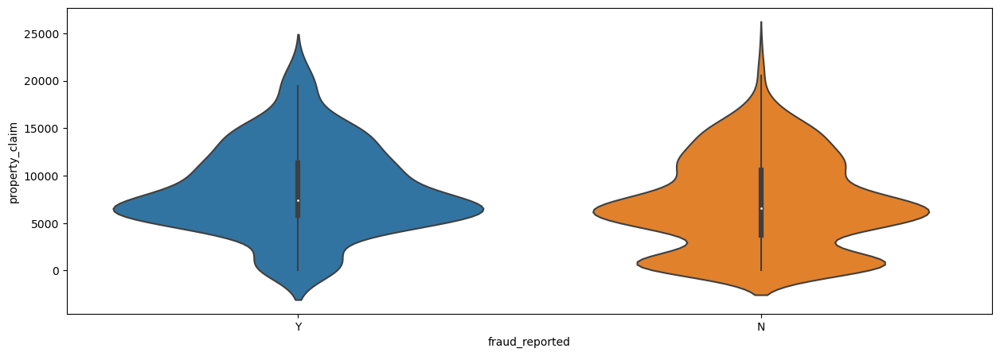

In [88]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='property_claim', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the property claim is between 6000-8000.</b>

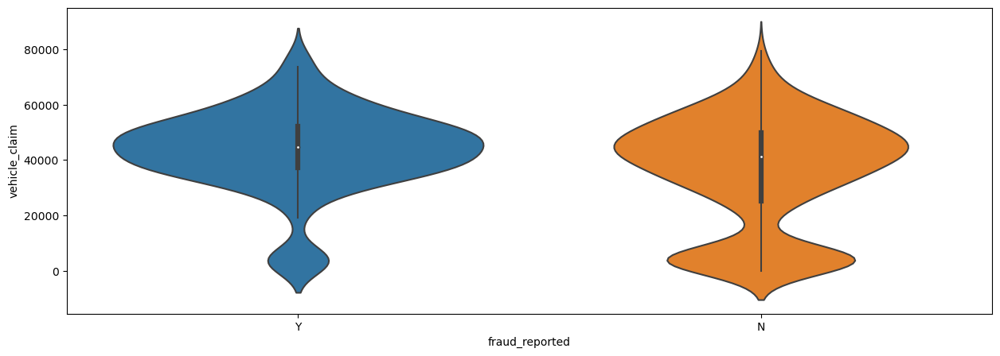

In [89]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='vehicle_claim', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the vehicle claim is between 40000-50000.</b>

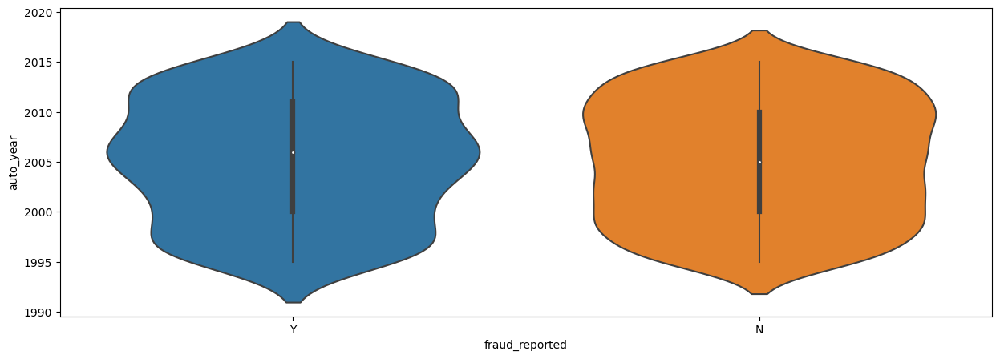

In [90]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='auto_year', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the auto year is 2005.</b>

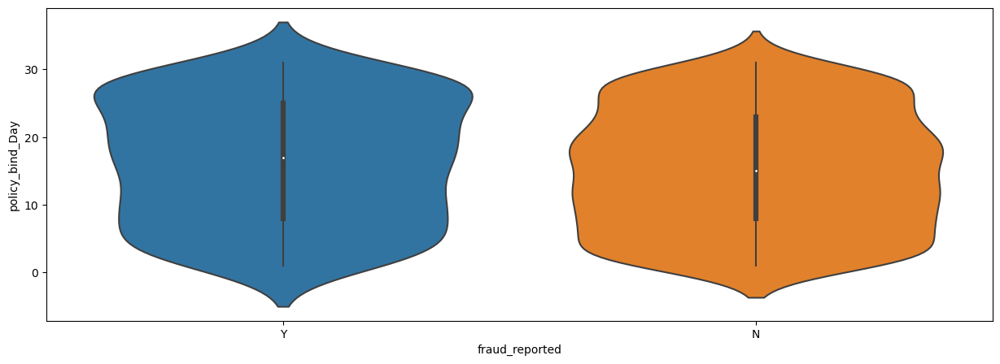

In [91]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='policy_bind_Day', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the policy bind day is 27.</b>

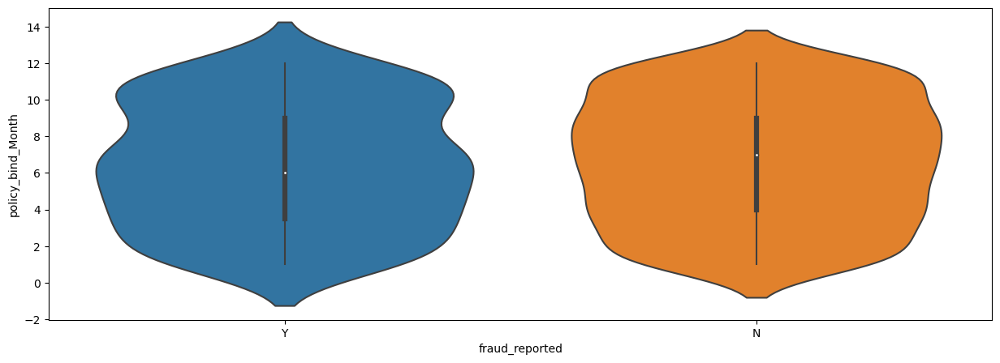

In [92]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='policy_bind_Month', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the policy bind month is 6.</b>

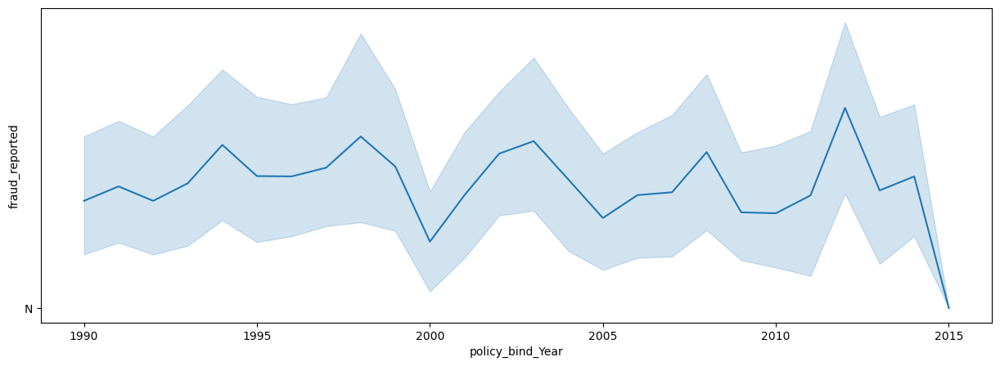

In [93]:
plt.figure(figsize=(15,5))
sns.lineplot(x='policy_bind_Year', y='fraud_reported', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the policy bind year is aroun 2013.</b>

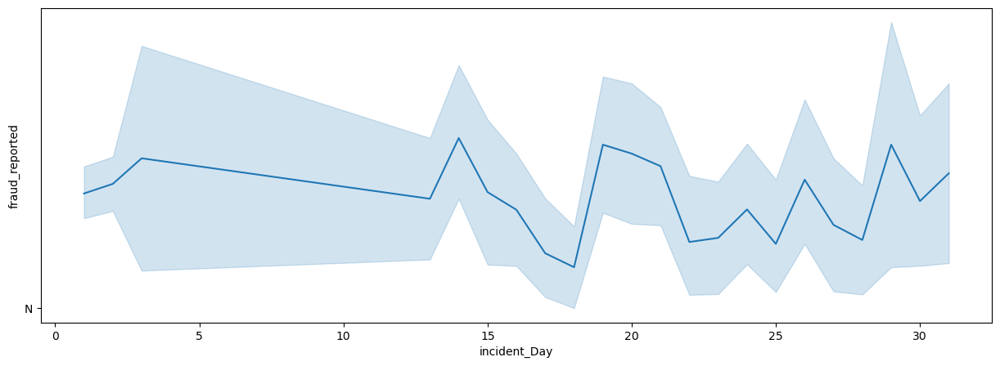

In [94]:
plt.figure(figsize=(15,5))
sns.lineplot(x='incident_Day', y='fraud_reported', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the incident day is around 29.</b>

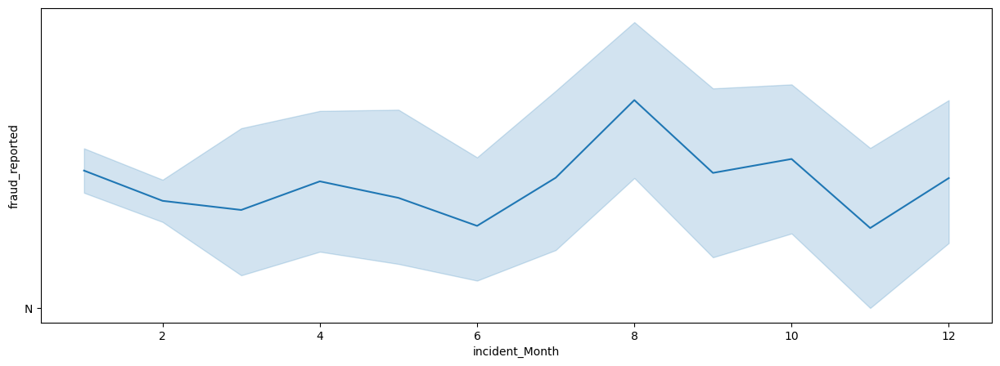

In [95]:
plt.figure(figsize=(15,5))
sns.lineplot(x='incident_Month', y='fraud_reported', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the incident month is 8.</b>

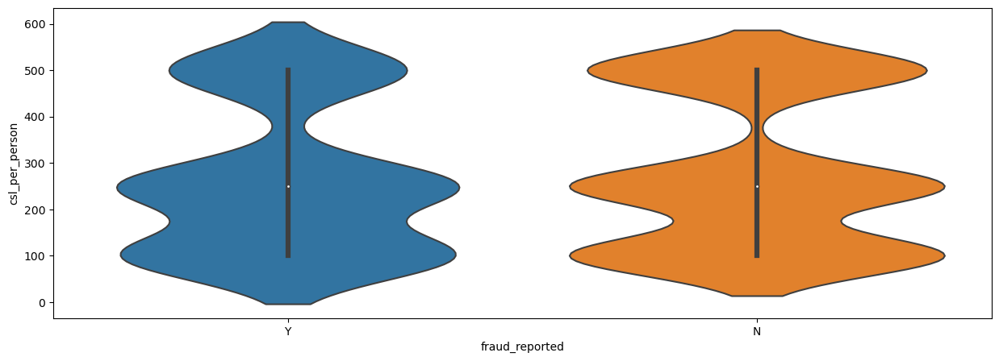

In [96]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='csl_per_person', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the csl per person is around 250.</b>

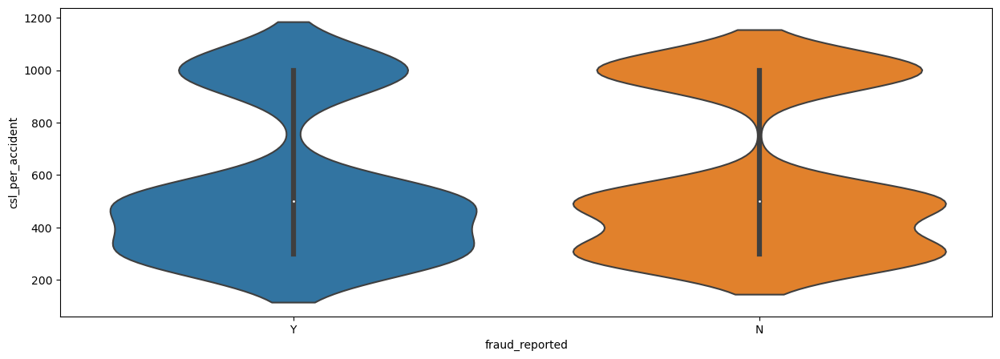

In [97]:
plt.figure(figsize=(15,5))
sns.violinplot(x='fraud_reported', y='csl_per_accident', data=df)
plt.show()

<b>As we can see, fraud is reported the highest, when the csl per accident is between 300-500.</b>

# Multivariate Analysis

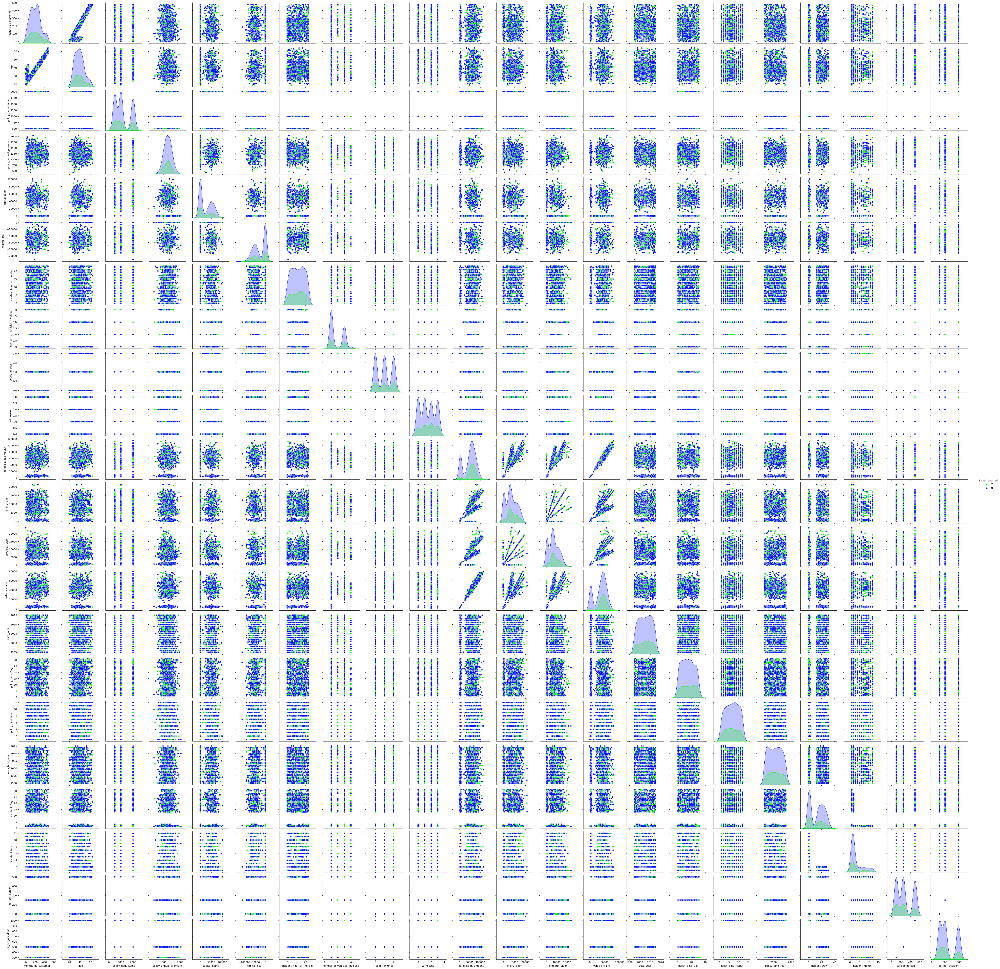

In [98]:
sns.pairplot(df, hue='fraud_reported', palette='hsv')
plt.show()

<b>This pairplot gives the pairwise relationship between the columns which is plotted on the basis of the target variable 'fraud_reported'. We can also observe relationship between all the features and the labels.</b>

# Identifying the outliers

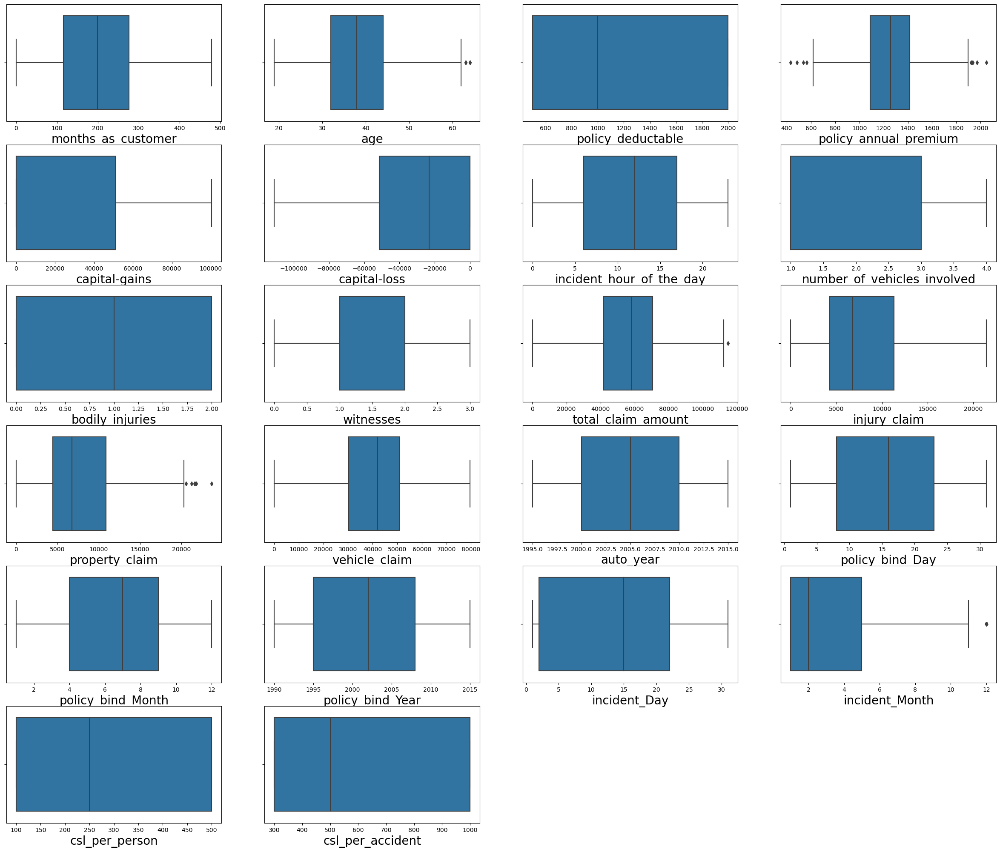

In [99]:
plt.figure(figsize=(30,25))
plotnumber=1

for column in numerical_columns:
    if plotnumber<=24:
        ax = plt.subplot(6,4,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column, fontsize=20)
    plotnumber+=1
plt.show()

<b>As we can see, outliers are present in the columns 'age', 'policy_annual_premium', 'total_claim_amount', 'property_claim' and 'incident_Month'.</b>

<b>Let's use Z-score method to remove the outliers.</b>

In [100]:
# Features containing outliers

features = df[['age', 'policy_annual_premium', 'total_claim_amount', 'property_claim', 'incident_Month']]

In [101]:
from scipy.stats import zscore

z = np.abs(zscore(features))
z

,age,policy_annual_premium,total_claim_amount,property_claim,incident_Month
0,0.990836,0.616705,0.714257,1.165505,0.735040
1,0.334073,0.242521,1.807312,1.372696,0.735040
2,1.088913,0.642233,0.686362,0.736072,0.429664
3,0.224613,0.652886,0.403135,0.219722,2.013343
4,0.552994,1.341980,1.753121,1.399654,0.429664
...,...,...,...,...,...
995,0.103769,0.222884,1.305049,0.273817,0.429664
996,0.224613,0.739141,2.111466,2.214794,0.735040
997,0.541611,0.520739,0.558507,0.020826,0.735040
998,2.523284,0.411866,0.219110,0.451976,0.429664


In [102]:
# Now, let's create a new dataframe

df_new = df[(z<3).all(axis=1)]
df_new

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,...,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,...,92x,2004,Y,17,10,2014,25,1,250,500
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,...,E400,2007,Y,27,6,2006,21,1,250,500
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,...,RAM,2007,N,9,6,2000,22,2,100,300
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,...,Tahoe,2014,Y,25,5,1990,1,10,250,500
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,...,RSX,2009,N,6,6,2014,17,2,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,...,Accord,2006,N,16,7,1991,22,2,500,1000
996,285,41,IL,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,...,Passat,2015,N,1,5,2014,24,1,100,300
997,130,34,OH,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,...,Impreza,1996,N,17,2,2003,23,1,250,500
998,458,62,IL,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,...,A5,1998,N,18,11,2011,26,2,500,1000


In [103]:
print(df.shape) 
print(df_new.shape) 

(1000, 39)
(996, 39)


# Percentage data loss

In [104]:
loss_percent = (1000-996)/1000*100
print(loss_percent, '%')

0.4 %


<b>As the data loss is just 0.4%, we can proceed further.</b>

# Checking for Skewness

In [105]:
df_new.skew().sort_values()

vehicle_claim                 -0.619755
total_claim_amount            -0.593473
capital-loss                  -0.393015
auto_year                     -0.049276
incident_hour_of_the_day      -0.039123
policy_bind_Month             -0.029722
bodily_injuries                0.011117
witnesses                      0.025758
policy_bind_Day                0.028923
policy_annual_premium          0.032042
incident_Day                   0.055659
policy_bind_Year               0.058499
injury_claim                   0.267970
property_claim                 0.357130
months_as_customer             0.359605
csl_per_person                 0.413713
policy_deductable              0.473229
age                            0.474526
capital-gains                  0.478850
number_of_vehicles_involved    0.500364
csl_per_accident               0.609316
incident_Month                 1.377097
dtype: float64

<b>The columns which do not lie in the range of +/-0.5 are 'vehicle_claim', 'total_claim_amount', 'csl_per_accident' and 'incident_Month'.             
Thus, skewness is present in these columns.</b>

# Removing Skewness using yeo-johnson method

In [106]:
skewed_features = ['vehicle_claim', 'total_claim_amount', 'csl_per_accident', 'incident_Month']

In [107]:
from sklearn.preprocessing import PowerTransformer

scaler = PowerTransformer(method='yeo-johnson')

In [108]:
df_new[skewed_features] = scaler.fit_transform(df_new[skewed_features].values)
df_new[skewed_features].head()

,vehicle_claim,total_claim_amount,csl_per_accident,incident_Month
0,0.754553,0.717556,0.052612,-1.101370
1,-1.787353,-1.777785,0.052612,-1.101370
2,-0.820820,-0.716483,-1.174021,-0.026479
3,0.678427,0.392931,0.052612,1.553647
4,-1.740710,-1.730555,1.313327,-0.026479


In [109]:
# Now, let's check the skewness again after applying yeo-johnson method

df_new.skew().sort_values()

vehicle_claim                 -0.521354
total_claim_amount            -0.508953
capital-loss                  -0.393015
auto_year                     -0.049276
incident_hour_of_the_day      -0.039123
policy_bind_Month             -0.029722
bodily_injuries                0.011117
witnesses                      0.025758
policy_bind_Day                0.028923
policy_annual_premium          0.032042
incident_Day                   0.055659
policy_bind_Year               0.058499
csl_per_accident               0.110964
injury_claim                   0.267970
incident_Month                 0.305741
property_claim                 0.357130
months_as_customer             0.359605
csl_per_person                 0.413713
policy_deductable              0.473229
age                            0.474526
capital-gains                  0.478850
number_of_vehicles_involved    0.500364
dtype: float64

<b>We can see that the skewness has been removed.</b>

<b>Now, let's visualize the data using distplot.</b>

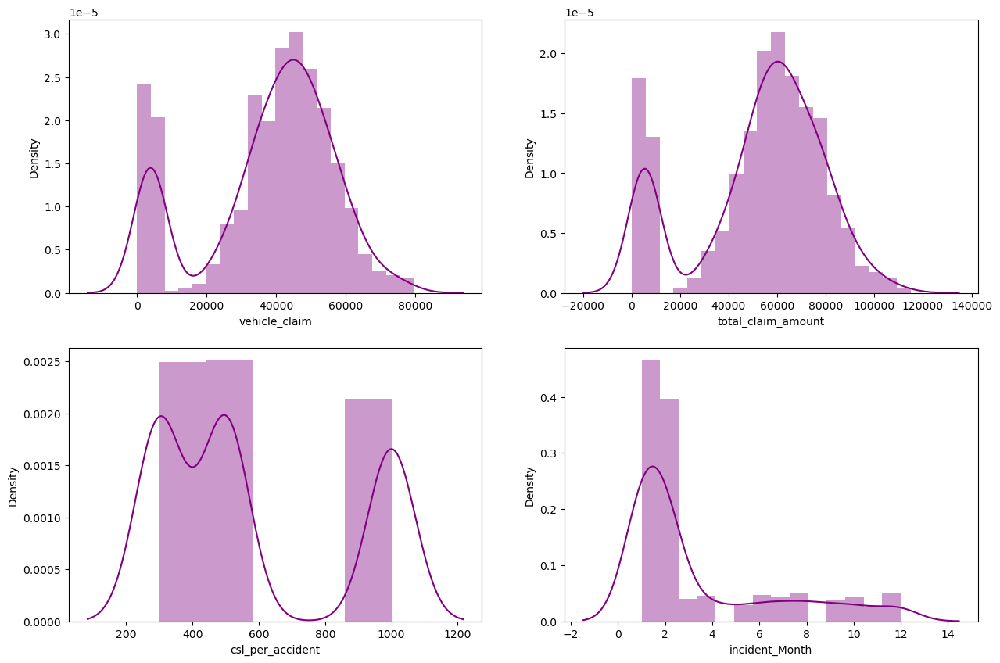

In [110]:
plt.figure(figsize=(15,10), facecolor='white')
plotnumber = 1

for column in df_new[skewed_features]:
    if plotnumber<=4:
        ax = plt.subplot(2,2,plotnumber)
        sns.distplot(df[column], color='purple')
        plt.xlabel(column,fontsize=10)
    plotnumber+=1
plt.show()

<b>We can see that the data is almost normally distributed for all the columns.</b>

# Encoding

In [111]:
from sklearn.preprocessing import LabelEncoder

LE = LabelEncoder()

df_new[categorical_columns] = df_new[categorical_columns].apply(LE.fit_transform)
df_new[categorical_columns]

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2,0,5,2,13,4,2,0,1,1,0,4,1,0,6,6,0
996,0,0,6,9,17,5,2,1,0,1,4,3,1,0,13,28,0
997,2,0,5,1,3,2,0,2,1,4,0,0,0,1,11,19,0
998,0,1,0,5,0,5,2,1,0,3,1,0,0,1,1,5,0


# Correlation between features and labels

In [112]:
df_new.corr()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,...,auto_model,auto_year,fraud_reported,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident
months_as_customer,1.000000,0.922092,0.000118,0.023512,-0.003378,0.059002,-0.000848,0.005365,-0.092575,0.071097,...,0.002908,0.001287,0.020966,0.054175,0.004955,-0.046010,-0.013502,0.019029,-0.022063,-0.022928
age,0.922092,1.000000,-0.015182,0.026772,0.005890,0.072900,0.001485,0.014030,-0.080587,0.075940,...,0.016258,0.003268,0.012408,0.054465,0.015874,-0.035505,-0.008174,0.016685,-0.012844,-0.012459
policy_state,0.000118,-0.015182,1.000000,0.010740,0.014475,-0.019294,-0.032551,-0.031016,-0.040215,-0.018855,...,-0.024513,0.002323,0.028864,0.001030,0.071527,-0.005709,0.013370,0.026233,-0.005866,-0.000653
policy_deductable,0.023512,0.026772,0.010740,1.000000,-0.008445,-0.011671,0.014571,-0.050024,0.005134,-0.021763,...,-0.003597,0.027497,0.015833,0.011204,-0.051368,-0.048465,-0.018867,-0.000169,0.006634,0.006179
policy_annual_premium,-0.003378,0.005890,0.014475,-0.008445,1.000000,0.041830,-0.021475,0.030963,-0.014376,0.006474,...,-0.034998,-0.040439,-0.010174,-0.030886,-0.028452,0.001650,0.016400,-0.012386,0.028569,0.030755
insured_sex,0.059002,0.072900,-0.019294,-0.011671,0.041830,1.000000,0.007473,-0.009257,-0.019600,0.004104,...,-0.017679,-0.028638,0.032173,0.045694,-0.007259,-0.031981,-0.007249,0.024223,-0.019001,-0.008959
insured_education_level,-0.000848,0.001485,-0.032551,0.014571,-0.021475,0.007473,1.000000,-0.021502,0.022806,-0.021595,...,0.050878,0.045094,0.011520,0.014464,-0.007489,0.017801,-0.055411,0.069312,0.011093,0.010425
insured_occupation,0.005365,0.014030,-0.031016,-0.050024,0.030963,-0.009257,-0.021502,1.000000,-0.009818,-0.008141,...,0.020878,-0.004827,0.003335,-0.003030,0.024516,-0.025282,-0.022786,0.013226,0.018978,0.019575
insured_hobbies,-0.092575,-0.080587,-0.040215,0.005134,-0.014376,-0.019600,0.022806,-0.009818,1.000000,-0.097837,...,0.031208,-0.015606,-0.047983,0.028387,-0.005233,-0.013819,0.014295,-0.001239,-0.013322,-0.007772
insured_relationship,0.071097,0.075940,-0.018855,-0.021763,0.006474,0.004104,-0.021595,-0.008141,-0.097837,1.000000,...,0.062286,-0.026099,0.017992,0.008900,0.040931,-0.006190,-0.083525,0.039255,-0.022125,-0.031298


# Correlation between features and labels using Heatmap

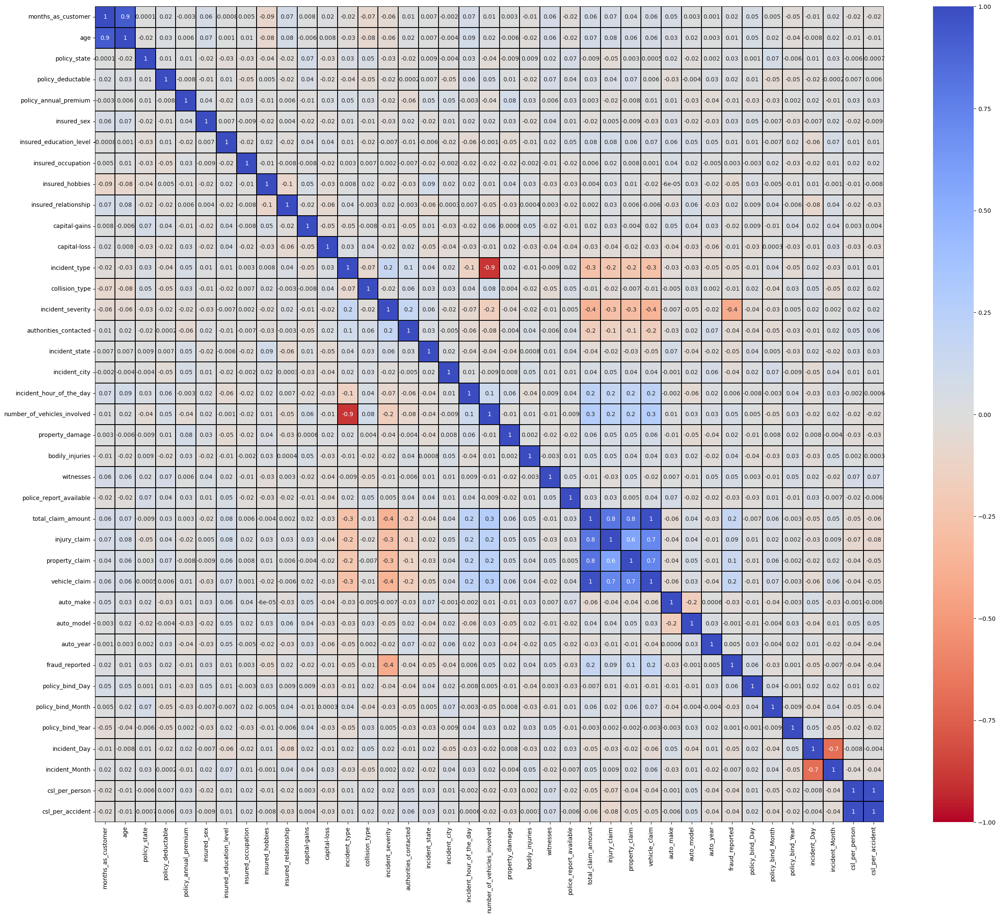

In [113]:
plt.figure(figsize=(30,25))
sns.heatmap(df_new.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black", annot = True, annot_kws={'size':10},cmap="coolwarm_r")
plt.yticks(rotation=0);

<b>The heatmap contains both positive and negative correlations.</b>

<b>As we can see, most of the columns are weakly correlated with the target column 'fraud_reported'.</b>

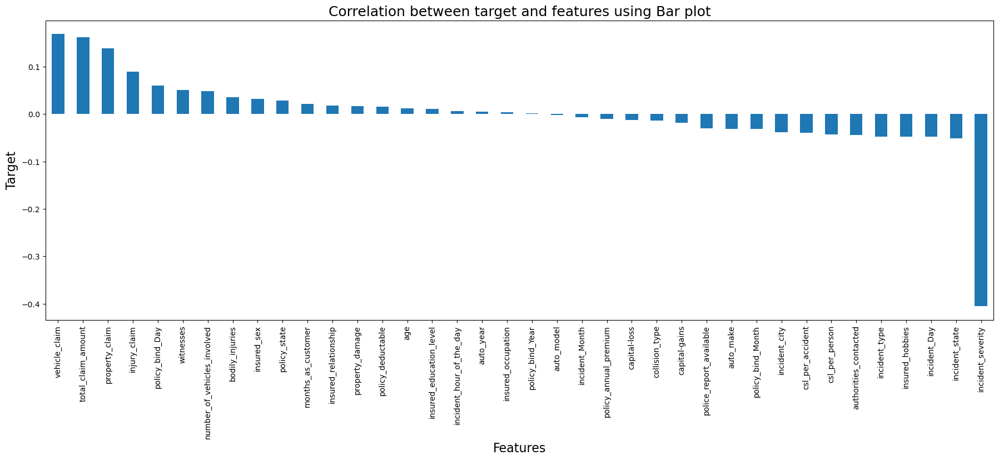

In [114]:
plt.figure(figsize=(22,7))
df_new.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar')
plt.xlabel('Features',fontsize=16)
plt.ylabel('Target',fontsize=16)
plt.title('Correlation between target and features using Bar plot',fontsize=18)
plt.show()

<b>As most of the columns are weakly correlated with the target column 'fraud_reported', we cannot afford to drop so many columns, as doing so, will result in a huge amount of data loss.</b>

In [115]:
x = df_new.drop('fraud_reported', axis=1)

y = df_new['fraud_reported']

In [116]:
x.shape

(996, 38)

In [117]:
y.shape

(996,)

# Balancing the dataset using SMOTE

In [118]:
y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

In [119]:
from imblearn.over_sampling import SMOTE

SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [120]:
y.value_counts()

1    750
0    750
Name: fraud_reported, dtype: int64

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

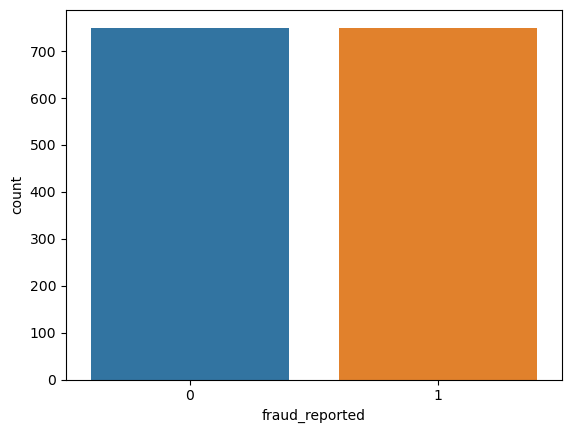

In [121]:
sns.countplot(y)

# Data Standardization using Standard Scaler

In [122]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,...,auto_make,auto_model,auto_year,policy_bind_Day,policy_bind_Month,policy_bind_Year,incident_Day,incident_Month,csl_per_person,csl_per_accident
0,1.114572,1.044806,1.369536,-0.266388,0.647915,1.277333,0.659751,-1.187333,1.433913,-1.466522,...,0.964383,-1.716104,-0.163576,0.169687,1.112762,1.812268,1.244921,-1.165002,-0.134893,0.066003
1,0.200809,0.355468,0.114616,1.445771,-0.268253,1.277333,0.659751,-0.127845,1.063202,-0.192024,...,0.436051,-0.664023,0.359216,1.355200,-0.128929,0.650185,0.839321,-1.165002,-0.134893,0.066003
2,-0.658129,-1.138096,1.369536,1.445771,0.675134,-0.782881,1.732516,1.196516,-1.346425,0.445225,...,-0.620615,1.057565,0.359216,-0.778724,-0.128929,-0.221377,0.940721,-0.036076,-1.134364,-1.252820
3,0.456663,0.240579,-1.140304,1.445771,0.686494,-0.782881,1.732516,-1.452205,-1.346425,1.082473,...,-0.884781,1.440140,1.579062,1.118098,-0.439352,-1.673980,-1.188678,1.623484,-0.134893,0.066003
4,0.200809,0.585247,-1.140304,-0.266388,1.421254,1.277333,-1.485780,1.196516,-1.346425,1.082473,...,-1.677280,1.153209,0.707743,-1.134379,-0.128929,1.812268,0.433722,-0.036076,1.530892,1.421468
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,-1.151562,-0.908317,-1.140304,-0.307480,1.188608,-0.782881,1.196133,0.931643,-1.346425,-0.192024,...,-0.356448,-1.046598,0.707743,0.999546,-1.681043,-0.511897,-1.087278,0.451463,-0.188198,0.003940
1496,0.401837,0.355468,-1.140304,-1.122467,-1.173838,-0.782881,-0.949397,-0.127845,-0.048934,-0.192024,...,0.436051,-0.568379,1.579062,0.525341,-1.060197,0.940706,0.028122,-0.403753,-1.134364,-1.252820
1497,-0.064183,-0.333869,-1.140304,-0.482120,-0.688547,-0.782881,-0.413015,1.196516,-0.790358,-0.192024,...,-0.620615,-0.185804,1.230534,-1.134379,-0.749775,-1.383460,0.636521,-1.165002,-1.134364,-1.252820
1498,-0.511927,-0.678538,-1.140304,-0.636214,1.774784,1.277333,-1.485780,-0.392717,0.507134,1.082473,...,-0.620615,0.579346,-0.512103,1.710854,1.112762,0.650185,-0.174678,-1.165002,-0.707923,-0.684498


<b>The data has been scaled now.</b>

# Checking VIF values to solve multicollinearity

In [123]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()

vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,7.584799,months_as_customer
1,7.544905,age
2,1.072978,policy_state
3,1.065737,policy_deductable
4,1.047067,policy_annual_premium
5,1.075795,insured_sex
6,1.054710,insured_education_level
7,1.034600,insured_occupation
8,1.073143,insured_hobbies
9,1.072030,insured_relationship


<b>The columns 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'csl_per_person' and 'csl_per_accident' have vif greater than 10. Let's drop the column with highest vif score, i.e, the column 'total_claim_amount'.</b>

In [124]:
x.drop('total_claim_amount', axis=1, inplace=True)

In [125]:
# Now, let's check the VIF again, after removing the column 'total_claim_amount'

vif = pd.DataFrame()
vif['VIF values'] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,7.575638,months_as_customer
1,7.543758,age
2,1.072926,policy_state
3,1.065363,policy_deductable
4,1.046085,policy_annual_premium
5,1.073147,insured_sex
6,1.054495,insured_education_level
7,1.033052,insured_occupation
8,1.072109,insured_hobbies
9,1.071833,insured_relationship


<b>Now, again let's drop the column with highest vif, i.e., the column 'csl_per_accident'.</b>

In [126]:
x.drop('csl_per_accident', axis=1, inplace=True)

In [127]:
# Now, let's check the VIF again, after removing the column 'csl_per_accident'

vif = pd.DataFrame()
vif['VIF values'] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,7.571252,months_as_customer
1,7.543615,age
2,1.072580,policy_state
3,1.065107,policy_deductable
4,1.044497,policy_annual_premium
5,1.070443,insured_sex
6,1.054460,insured_education_level
7,1.033026,insured_occupation
8,1.071318,insured_hobbies
9,1.066922,insured_relationship


<b>As we can see, the vif value of all the columns is less than 10. Hence, we can conclude that the multicollinearity problem has been solved.</b>

# Finding best random state

In [128]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn import metrics

In [129]:
from sklearn.ensemble import RandomForestClassifier

maxAccu = 0
maxRS = 0
for i in range(1,200):
    xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=.25, random_state =i)
    rfc = RandomForestClassifier()
    rfc.fit(xtrain, ytrain)
    pred = rfc.predict(xtest)
    acc=accuracy_score(ytest, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ", maxAccu, " on Random_state ", maxRS)

Best accuracy is  0.9066666666666666  on Random_state  80


# Train Test Split

In [130]:
# Now, let's split the data into training and testing data

xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.30, random_state=maxRS)

In [131]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, roc_auc_score

# Random Forest Classifier

In [132]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()
rfc.fit(xtrain,ytrain)
pred_rfc = rfc.predict(xtest)
print(f"Accuracy Score: {accuracy_score(ytest,pred_rfc)*100}%")
print(f"roc_auc_score: {roc_auc_score(ytest,pred_rfc)*100}%")
print("---------------------------------------------------")

print(f"Confusion Matrix : \n {confusion_matrix(ytest,pred_rfc)}\n")
print(f"CLASSIFICATION REPORT : \n {classification_report(ytest,pred_rfc)}")

Accuracy Score: 90.22222222222223%
roc_auc_score: 90.24120424329824%
---------------------------------------------------
Confusion Matrix : 
 [[206  17]
 [ 27 200]]

CLASSIFICATION REPORT : 
               precision    recall  f1-score   support

           0       0.88      0.92      0.90       223
           1       0.92      0.88      0.90       227

    accuracy                           0.90       450
   macro avg       0.90      0.90      0.90       450
weighted avg       0.90      0.90      0.90       450



# Support Vector Machine Classifier

In [133]:
from sklearn.svm import SVC

svc = SVC()
svc.fit(xtrain,ytrain)
pred_svc = svc.predict(xtest)
print(f"Accuracy Score: {accuracy_score(ytest,pred_svc)*100}%")
print(f"roc_auc_score: {roc_auc_score(ytest,pred_svc)*100}%")
print("---------------------------------------------------")

print(f"Confusion Matrix : \n {confusion_matrix(ytest,pred_svc)}\n")
print(f"CLASSIFICATION REPORT : \n {classification_report(ytest,pred_svc)}")

Accuracy Score: 85.33333333333334%
roc_auc_score: 85.35192904130697%
---------------------------------------------------
Confusion Matrix : 
 [[195  28]
 [ 38 189]]

CLASSIFICATION REPORT : 
               precision    recall  f1-score   support

           0       0.84      0.87      0.86       223
           1       0.87      0.83      0.85       227

    accuracy                           0.85       450
   macro avg       0.85      0.85      0.85       450
weighted avg       0.85      0.85      0.85       450



# XGB Classifier Model

In [134]:
from xgboost import XGBClassifier

xgb = XGBClassifier()
xgb.fit(xtrain,ytrain)
pred_xgb = xgb.predict(xtest)

print(f"Accuracy Score: {accuracy_score(ytest,pred_xgb)*100}%")
print(f"roc_auc_score: {roc_auc_score(ytest,pred_xgb)*100}%")
print("--------------------------------------------------------")

print(f"Confusion Matrix : \n {confusion_matrix(ytest,pred_xgb)}\n")
print(f"CLASSIFICATION REPORT : \n {classification_report(ytest,pred_xgb)}")

Accuracy Score: 90.0%
roc_auc_score: 90.00908713774916%
--------------------------------------------------------
Confusion Matrix : 
 [[203  20]
 [ 25 202]]

CLASSIFICATION REPORT : 
               precision    recall  f1-score   support

           0       0.89      0.91      0.90       223
           1       0.91      0.89      0.90       227

    accuracy                           0.90       450
   macro avg       0.90      0.90      0.90       450
weighted avg       0.90      0.90      0.90       450



# Gradient Boosting Classifier

In [135]:
from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier()
gbc.fit(xtrain,ytrain)
pred_gbc = gbc.predict(xtest)

print(f"Accuracy Score: {accuracy_score(ytest,pred_gbc)*100}%")
print(f"roc_auc_score: {roc_auc_score(ytest,pred_gbc)*100}%")
print("--------------------------------------------------------")

print(f"Confusion Matrix : \n {confusion_matrix(ytest,pred_gbc)}\n")
print(f"CLASSIFICATION REPORT : \n {classification_report(ytest,pred_gbc)}")

Accuracy Score: 88.66666666666667%
roc_auc_score: 88.6835503052093%
--------------------------------------------------------
Confusion Matrix : 
 [[202  21]
 [ 30 197]]

CLASSIFICATION REPORT : 
               precision    recall  f1-score   support

           0       0.87      0.91      0.89       223
           1       0.90      0.87      0.89       227

    accuracy                           0.89       450
   macro avg       0.89      0.89      0.89       450
weighted avg       0.89      0.89      0.89       450



# Bagging Classifier

In [136]:
from sklearn.ensemble import BaggingClassifier

bc = BaggingClassifier()
bc.fit(xtrain,ytrain)
pred_bc = bc.predict(xtest)

print(f"Accuracy Score: {accuracy_score(ytest,pred_bc)*100}%")
print(f"roc_auc_score: {roc_auc_score(ytest,pred_bc)*100}%")
print("--------------------------------------------------------")

print(f"Confusion Matrix : \n {confusion_matrix(ytest,pred_bc)}\n")
print(f"CLASSIFICATION REPORT : \n {classification_report(ytest,pred_bc)}")

Accuracy Score: 87.77777777777777%
roc_auc_score: 87.81039489539914%
--------------------------------------------------------
Confusion Matrix : 
 [[204  19]
 [ 36 191]]

CLASSIFICATION REPORT : 
               precision    recall  f1-score   support

           0       0.85      0.91      0.88       223
           1       0.91      0.84      0.87       227

    accuracy                           0.88       450
   macro avg       0.88      0.88      0.88       450
weighted avg       0.88      0.88      0.88       450



# Extra Trees Classifier

In [137]:
from sklearn.ensemble import ExtraTreesClassifier

etc = ExtraTreesClassifier()
etc.fit(xtrain,ytrain)
pred_etc = etc.predict(xtest)

print(f"Accuracy Score: {accuracy_score(ytest,pred_etc)*100}%")
print(f"roc_auc_score: {roc_auc_score(ytest,pred_etc)*100}%")
print("--------------------------------------------------------")

print(f"Confusion Matrix : \n {confusion_matrix(ytest,pred_etc)}\n")
print(f"CLASSIFICATION REPORT : \n {classification_report(ytest,pred_etc)}")

Accuracy Score: 89.77777777777777%
roc_auc_score: 89.78882282056853%
--------------------------------------------------------
Confusion Matrix : 
 [[203  20]
 [ 26 201]]

CLASSIFICATION REPORT : 
               precision    recall  f1-score   support

           0       0.89      0.91      0.90       223
           1       0.91      0.89      0.90       227

    accuracy                           0.90       450
   macro avg       0.90      0.90      0.90       450
weighted avg       0.90      0.90      0.90       450



# Cross-Validation

In [138]:
from sklearn.model_selection import cross_val_score


print("Cross validation score of RandomForestClassifier() is:", cross_val_score(rfc,x,y,cv=5).mean())
print("Cross validation score of SVC() is:", cross_val_score(svc,x,y,cv=5).mean())
print("Cross validation score of XGBClassifier() is:", cross_val_score(xgb,x,y,cv=5).mean())
print("Cross validation score of GradientBoostingClassifier() is:", cross_val_score(gbc,x,y,cv=5).mean())
print("Cross validation score of BaggingClassifier() is:", cross_val_score(bc,x,y,cv=5).mean())
print("Cross validation score of ExtraTreesClassifier() is:", cross_val_score(etc,x,y,cv=5).mean())

Cross validation score of RandomForestClassifier() is: 0.8579999999999999
Cross validation score of SVC() is: 0.8246666666666667
Cross validation score of XGBClassifier() is: 0.8733333333333334
Cross validation score of GradientBoostingClassifier() is: 0.8553333333333333
Cross validation score of BaggingClassifier() is: 0.8486666666666667
Cross validation score of ExtraTreesClassifier() is: 0.8593333333333334


<b>As we can see, XGBClassifier is the best model.</b>

# Hyperparameter Tuning

In [139]:
# Now, let's perform Hyperparameter Tuning for XGBClassifier

from sklearn.model_selection import GridSearchCV

parameters = {'max_depth': [3, 6, 10, 15],
              'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.4],
              'subsample': np.arange(0.5, 1.0, 0.1),
              'colsample_bytree': np.arange(0.5, 1.0, 0.1),
              }


GCV = GridSearchCV(XGBClassifier(), parameters, cv=5)

GCV.fit(xtrain, ytrain)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             param_grid={'colsample_bytree': array([0.5, 0.6, 0.7, 0.8, 0.9]),
                         'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.4],
                         'max_depth': [3, 6, 10, 15],
                         'subsample': array([0.5, 0.6, 0.7, 0.8, 0.9])})

In [140]:
GCV.best_params_

{'colsample_bytree': 0.6,
 'learning_rate': 0.1,
 'max_depth': 15,
 'subsample': 0.8999999999999999}

In [147]:
#Let's train and test our model using the best parameters

model =XGBClassifier(colsample_bytree=0.6, learning_rate=0.1, max_depth=15, subsample=0.8999999999999999)
model.fit(xtrain,ytrain)
pred = model.predict(xtest)
print(accuracy_score(ytest,pred)*100)


print(f"Accuracy Score: {accuracy_score(ytest,pred)*100}%")
print("---------------------------------------------------")

print(f"roc_auc_score: {roc_auc_score(ytest,pred_rfc)*100}%")
print("---------------------------------------------------")

print(f"Confusion Matrix : \n {confusion_matrix(ytest,pred)}\n")
print("---------------------------------------------------")

print(f"Classification Report : \n {classification_report(ytest,pred)}")
print("---------------------------------------------------")

91.77777777777779
Accuracy Score: 91.77777777777779%
---------------------------------------------------
roc_auc_score: 90.24120424329824%
---------------------------------------------------
Confusion Matrix : 
 [[204  19]
 [ 18 209]]

---------------------------------------------------
Classification Report : 
               precision    recall  f1-score   support

           0       0.92      0.91      0.92       223
           1       0.92      0.92      0.92       227

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450

---------------------------------------------------


<b>After Hyperparameter Tuning, we got an accuracy score of 91.77%.</b>

# ROC curve for the final model

In [148]:
from sklearn.metrics import plot_roc_curve 

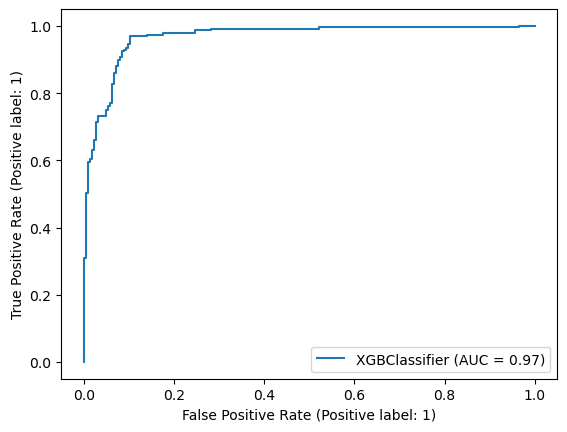

In [149]:
#Lets check our model performance after hyperparameter tuning

plot_roc_curve(model, xtest, ytest)
plt.show()

# Saving the model

In [150]:
import joblib

joblib.dump(model, 'Insurance Claims Fraud Detection.pkl')

['Insurance Claims Fraud Detection.pkl']

In [151]:
loadmodel = joblib.load('Insurance Claims Fraud Detection.pkl')

In [152]:
import numpy as np

a = np.array(ytest)
predicted = np.array(loadmodel.predict(xtest))
df_final = pd.DataFrame({"Original":a,"Predicted":predicted},index=range(len(a)))
df_final

,Original,Predicted
0,0,0
1,1,1
2,0,1
3,0,0
4,0,0
...,...,...
445,0,0
446,1,1
447,1,1
448,1,1


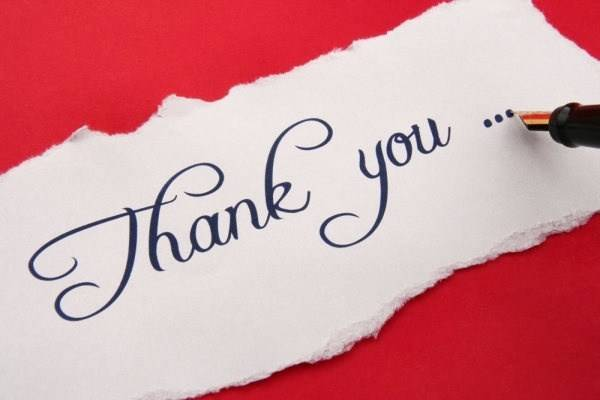